# Import Libraries

In [ ]:
# Mengabaikan peringatan yang tidak diperlukan
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=UserWarning)

# Mengimpor library yang dibutuhkan
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import itertools

# Mengimpor model klasifikasi yang akan digunakan
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier, LocalOutlierFactor
from sklearn.tree import DecisionTreeClassifier
from lightgbm import LGBMClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier

# Mengimpor fungsi-fungsi yang dibutuhkan untuk pemodelan dan evaluasi
from sklearn.model_selection import (
    train_test_split, KFold, cross_val_score,
    GridSearchCV, train_test_split,
)
from sklearn.preprocessing import (
    scale, LabelEncoder, StandardScaler,
    MinMaxScaler, Normalizer, RobustScaler
)

from sklearn.metrics import (
    classification_report, accuracy_score, f1_score,
    precision_score, confusion_matrix, recall_score,
    roc_auc_score, roc_curve
)

# Untuk menampilkan semua kolom dan baris dalam output
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

# Menentukan jumlah digit di belakang koma yang akan ditampilkan
pd.set_option('display.float_format', lambda x: '%.2f' % x)

# 1.&nbsp;Load Dataset

## 1.1 Description

Data Set Story:
- It consists of 10000 observations and 12 variables.
- Independent variables contain information about customers.
- Dependent variable refers to customer abandonment.


Features:
- Surname: Surname
- CreditScore: Credit score
- Geography: Country (Germany / France / Spain)
- Gender: Gender (Female / Male)
- Age: Age
- Tenure: How many years of customer
- Balance: Balance
- NumOfProducts: Bank product used
- HasCrCard: Credit card status (0 = No, 1 = Yes)
- IsActiveMember: Active membership status (0 = No, 1 = Yes)
- EstimatedSalary: Estimated salary
- Exited: Abandoned or not? (0 = No, 1 = Yes)

In [ ]:
# Mengimpor dataset dari file CSV dan menetapkan kolom pertama sebagai indeks
df = pd.read_csv("Churn_Modelling.csv", index_col=0)

# Menampilkan lima baris pertama dari dataset
df.head()

,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
RowNumber,,,,,,,,,,,,,
1,15634602,Hargrave,619,France,Female,42,2,0.00,1,1,1,101348.88,1
2,15647311,Hill,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0
3,15619304,Onio,502,France,Female,42,8,159660.80,3,1,0,113931.57,1
4,15701354,Boni,699,France,Female,39,1,0.00,2,0,0,93826.63,0
5,15737888,Mitchell,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0


# 2.&nbsp;EDA


### 2.1 Data Preparation

In [ ]:
# Menetapkan nama variabel target
dependent_variable_name = "Exited"

In [ ]:
def show_unique_count_variables(df):
    # Menampilkan jumlah nilai unik untuk setiap variabel
    for index, value in df.nunique().items():
        print(str(index) + "\n\t\t\t:" + str(value))

def data_prepare():
    # Membuat salinan DataFrame
    df_prep = df.copy()

    # Menghitung jumlah nilai yang hilang
    missing_value_len = df.isnull().any().sum()
    if missing_value_len == 0:
        print("No Missing Value")
    else:
        print("Investigate Missing Value, Missing Value : " + str(missing_value_len))
    print("\n")

    # Menampilkan jumlah nilai unik untuk setiap variabel
    show_unique_count_variables(df=df_prep)

    # Mengonversi kolom 'Tenure' dan 'NumOfProducts' ke tipe data float
    df_prep['Tenure'] = df_prep.Tenure.astype(np.float)
    df_prep['NumOfProducts'] = df_prep.NumOfProducts.astype(np.float)
    return df_prep

In [ ]:
# Memanggil fungsi show_unique_count_variables
show_unique_count_variables(df)

CustomerId
			:10000
Surname
			:2932
CreditScore
			:460
Geography
			:3
Gender
			:2
Age
			:70
Tenure
			:11
Balance
			:6382
NumOfProducts
			:4
HasCrCard
			:2
IsActiveMember
			:2
EstimatedSalary
			:9999
Exited
			:2


In [ ]:
# Memanggil fungsi data_prepare
data_prepare()

No Missing Value


CustomerId
			:10000
Surname
			:2932
CreditScore
			:460
Geography
			:3
Gender
			:2
Age
			:70
Tenure
			:11
Balance
			:6382
NumOfProducts
			:4
HasCrCard
			:2
IsActiveMember
			:2
EstimatedSalary
			:9999
Exited
			:2


,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
RowNumber,,,,,,,,,,,,,
1,15634602,Hargrave,619,France,Female,42,2.00,0.00,1.00,1,1,101348.88,1
2,15647311,Hill,608,Spain,Female,41,1.00,83807.86,1.00,0,1,112542.58,0
3,15619304,Onio,502,France,Female,42,8.00,159660.80,3.00,1,0,113931.57,1
4,15701354,Boni,699,France,Female,39,1.00,0.00,2.00,0,0,93826.63,0
5,15737888,Mitchell,850,Spain,Female,43,2.00,125510.82,1.00,1,1,79084.10,0
6,15574012,Chu,645,Spain,Male,44,8.00,113755.78,2.00,1,0,149756.71,1
7,15592531,Bartlett,822,France,Male,50,7.00,0.00,2.00,1,1,10062.80,0
8,15656148,Obinna,376,Germany,Female,29,4.00,115046.74,4.00,1,0,119346.88,1
9,15792365,He,501,France,Male,44,4.00,142051.07,2.00,0,1,74940.50,0


### 2.2. Outliers Observe (LOF method and Supress)

#### 2.2.1. Outlier Editing

In [ ]:
def show_outliers(df):
    # Menampilkan boxplot untuk mendeteksi outlier pada variabel numerik
    numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
    df_num_cols = df.select_dtypes(include=numerics)
    sns.set(font_scale=0.7)
    fig, axes = plt.subplots(
        nrows=2, ncols=5,
        gridspec_kw=dict(hspace=0.3), figsize=(12, 9)
    )
    fig.tight_layout()
    for ax, col in zip(axes.flatten(), df_num_cols.columns):
        sns.boxplot(x=df_num_cols[col], color='green', ax=ax)
    fig.suptitle('Observing Outliers', color='r', fontsize=14)

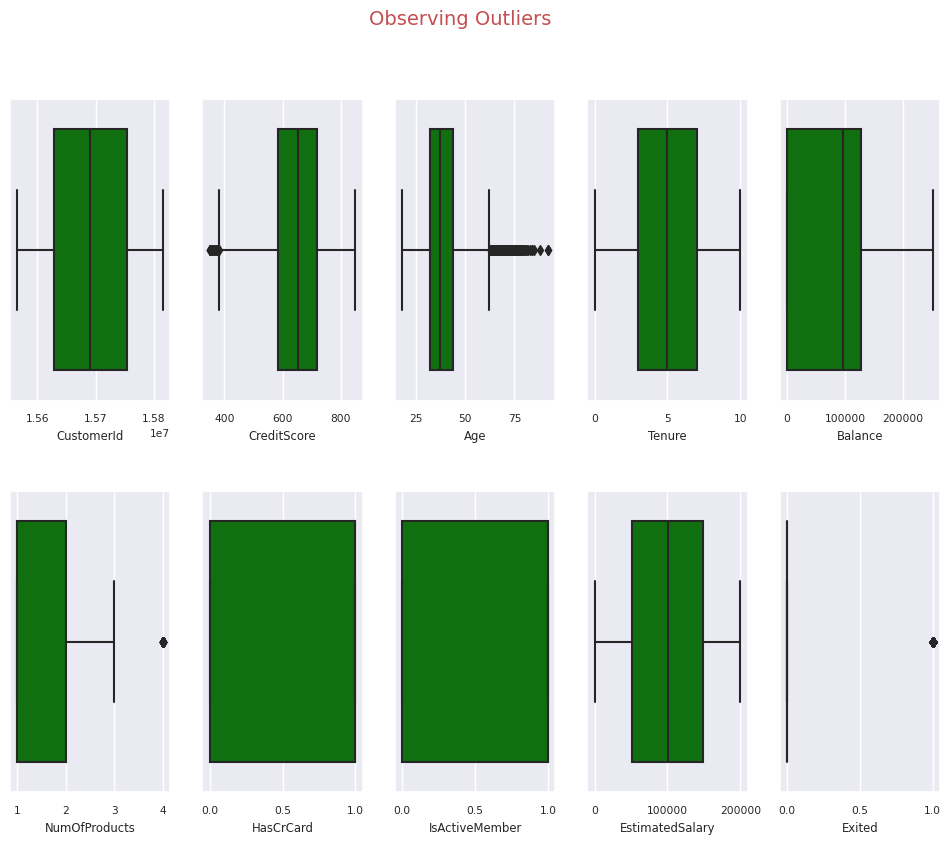

In [ ]:
# Memanggil fungsi show_outliers
show_outliers(df)

#### 2.2.2. Visualization of outliers according to the LOF method

In [ ]:
def lof_observation(df):
    # Memilih kolom numerik dari DataFrame
    numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
    df_num_cols = df.select_dtypes(include=numerics)

    # Mengubah tipe data kolom numerik menjadi float64
    df_outlier = df_num_cols.astype("float64")

    # Menggunakan Local Outlier Factor (LOF) untuk mendeteksi outlier
    clf = LocalOutlierFactor(n_neighbors=20, contamination=0.1)
    clf.fit_predict(df_outlier)
    df_scores = clf.negative_outlier_factor_

    # Visualisasi outlier menggunakan plot stack
    scores_df = pd.DataFrame(np.sort(df_scores))
    scores_df.plot(
        stacked=True, xlim=[0, 20], color='r',
        title='Visualisasi outlier berdasarkan metode LOF',
        style='.-');  # 20 observasi pertama

    # Menentukan nilai threshold untuk mengidentifikasi outlier
    th_val = np.sort(df_scores)[2]
    outliers = df_scores > th_val

    # Menghapus baris yang terdeteksi sebagai outlier
    df = df.drop(df_outlier[~outliers].index)

    # Menampilkan ukuran DataFrame setelah menghapus outlier
    df.shape
    return df

Ukuran DataFrame Sebelum: (10000, 13)
Ukuran DataFrame Sesudah: (9997, 13)


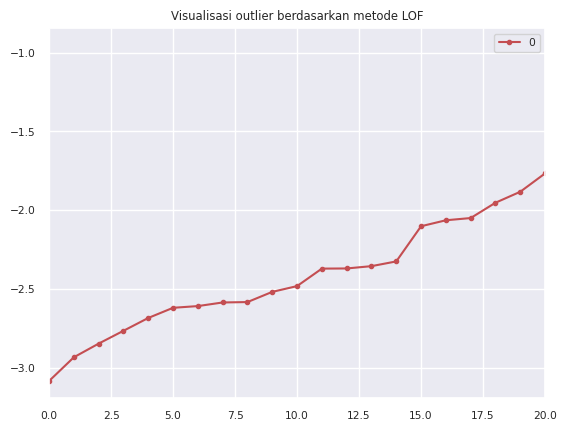

In [ ]:
# Menyimpan ukuran DataFrame sebelum pemanggilan fungsi
shape_before = df.shape

# Memanggil fungsi lof_observation untuk menghilangkan outlier
df_cleaned = lof_observation(df)

# Menyimpan ukuran DataFrame setelah pemanggilan fungsi
shape_after = df_cleaned.shape

# Membandingkan ukuran DataFrame sebelum dan setelah pemanggilan fungsi
print(f"Ukuran DataFrame Sebelum: {shape_before}")
print(f"Ukuran DataFrame Sesudah: {shape_after}")

##### Insights 💡
1. **Ukuran DataFrame Sebelum: (10000, 13)**
    - DataFrame memiliki 10.000 baris dan 13 kolom sebelum fungsi dipanggil.

2. **Ukuran DataFrame Sesudah: (9997, 13)**
    - Tiga baris telah dihapus karena dianggap sebagai outlier oleh metode LOF.

3. **Grafik garis menunjukkan bahwa jumlah outlier meningkat dari awal hingga akhir periode**
    - Semakin lama periode tersebut, semakin banyak data yang tidak sesuai dengan pola umum data. Data-data tersebut kemungkinan merupakan outlier yang disebabkan oleh berbagai faktor.

#### 2.2.3. Outlier suppression

In [ ]:
def clear_outliers(df):
    # Menghitung kuartil pertama (Q1) untuk kolom "Age"
    Q1 = df["Age"].quantile(0.25)

    # Menghitung kuartil ketiga (Q3) untuk kolom "Age"
    Q3 = df["Age"].quantile(0.75)

    # Menghitung Interquartile Range (IQR) untuk kolom "Age"
    IQR = Q3 - Q1

    # Menentukan batas bawah dan batas atas untuk identifikasi outlier
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR

    # Menampilkan batas bawah dan batas atas
    print("When age is below lower score:", lower, "and above upper score:", upper)

    # Mengidentifikasi dan mengganti nilai outlier pada kolom "Age"
    df_outlier = df["Age"][(df["Age"] > upper)]
    df["Age"][df_outlier.index] = upper

    # Menghitung kuartil pertama (Q1) untuk kolom "CreditScore"
    Q1 = df["CreditScore"].quantile(0.25)

    # Menghitung kuartil ketiga (Q3) untuk kolom "CreditScore"
    Q3 = df["CreditScore"].quantile(0.75)

    # Menghitung Interquartile Range (IQR) untuk kolom "CreditScore"
    IQR = Q3 - Q1

    # Menentukan batas bawah dan batas atas untuk identifikasi outlier
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR

    # Menampilkan batas bawah dan batas atas
    print("When credit score is below lower score:", lower, "and above upper score:", upper)

    # Mengidentifikasi dan mengganti nilai outlier pada kolom "CreditScore"
    df_outlier = df["CreditScore"][(df["CreditScore"] < lower)]
    df["CreditScore"][df_outlier.index] = lower

    return df

In [ ]:
# Memanggil fungsi clear_outliers
clear_outliers(df)

When age is below lower score: 14.0 and above upper score: 62.0
When credit score is below lower score: 383.0 and above upper score: 919.0


<ipython-input-12-d1915443266f>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["Age"][df_outlier.index] = upper
<ipython-input-12-d1915443266f>:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["CreditScore"][df_outlier.index] = lower


,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
RowNumber,,,,,,,,,,,,,
1,15634602,Hargrave,619,France,Female,42,2,0.00,1,1,1,101348.88,1
2,15647311,Hill,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0
3,15619304,Onio,502,France,Female,42,8,159660.80,3,1,0,113931.57,1
4,15701354,Boni,699,France,Female,39,1,0.00,2,0,0,93826.63,0
5,15737888,Mitchell,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0
6,15574012,Chu,645,Spain,Male,44,8,113755.78,2,1,0,149756.71,1
7,15592531,Bartlett,822,France,Male,50,7,0.00,2,1,1,10062.80,0
8,15656148,Obinna,383,Germany,Female,29,4,115046.74,4,1,0,119346.88,1
9,15792365,He,501,France,Male,44,4,142051.07,2,0,1,74940.50,0


##### Insights 💡

1. **Age (Usia):**
   - Nilai minimum yang dianggap normal atau tidak sebagai outlier adalah 14.
   - Nilai maksimum yang dianggap normal atau tidak sebagai outlier adalah 62.
   - Nilai-nilai di luar rentang ini dianggap sebagai outlier dan akan digantikan oleh nilai batas bawah (14.0) atau batas atas (62.0).

2. **Credit Score:**
   - Nilai minimum yang dianggap normal atau tidak sebagai outlier adalah 383.0.
   - Nilai maksimum yang dianggap normal atau tidak sebagai outlier adalah 919.0.
   - Nilai-nilai di luar rentang ini dianggap sebagai outlier dan akan digantikan oleh nilai batas bawah (383.0) atau batas atas (919.0).

Dengan kata lain, nilai-nilai di kolom "Age" dianggap sebagai outlier jika kurang dari 14 atau lebih dari 62. Begitu juga, nilai-nilai di kolom "Credit Score" dianggap sebagai outlier jika kurang dari 383.0 atau lebih dari 919.0. Fungsi `clear_outliers` bertujuan untuk menggantikan nilai-nilai outlier ini dengan batas bawah atau batas atas yang ditentukan.

#### 2.2.4. Outlier Process

In [ ]:
def outlier_process(df):
    # Mendeteksi dan menghapus outlier menggunakan metode Local Outlier Factor (LOF)
    df_outlier = lof_observation(df=df)

    # Membersihkan outlier yang masih tersisa menggunakan metode IQR
    df_outlier = clear_outliers(df=df_outlier)

    # Mengembalikan DataFrame yang telah diproses dari outlier
    return df_outlier

When age is below lower score: 14.0 and above upper score: 62.0
When credit score is below lower score: 383.0 and above upper score: 919.0


<ipython-input-12-d1915443266f>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["Age"][df_outlier.index] = upper
<ipython-input-12-d1915443266f>:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["CreditScore"][df_outlier.index] = lower


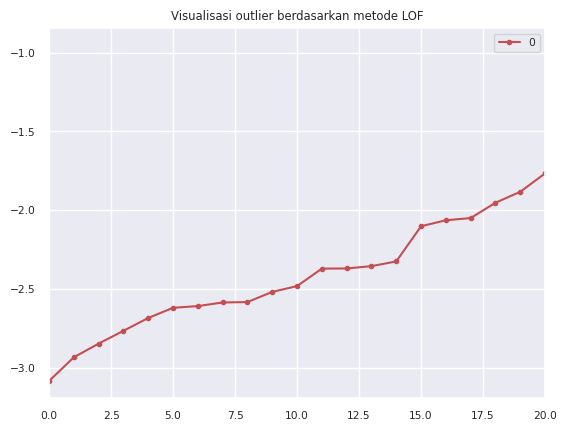

In [ ]:
# Memanggil fungsi untuk mengolah outlier pada DataFrame
df_processed = outlier_process(df)

### 2.3. Data Analysis

#### 2.3.1. Dependent variable distribution

In [ ]:
# Menampilkan distribusi variabel tergantung terhadap beberapa variabel independen
def show_dependent_variable(df):
    fig, axarr = plt.subplots(2, 3, figsize=(18, 6))

    # Plot untuk variabel 'Geography'
    sns.countplot(x='Geography', hue='Exited', data=df, ax=axarr[0][0])

    # Plot untuk variabel 'Gender'
    sns.countplot(x='Gender', hue='Exited', data=df, ax=axarr[0][1])

    # Plot untuk variabel 'HasCrCard'
    sns.countplot(x='HasCrCard', hue='Exited', data=df, ax=axarr[0][2])

    # Plot untuk variabel 'IsActiveMember'
    sns.countplot(x='IsActiveMember', hue='Exited', data=df, ax=axarr[1][0])

    # Plot untuk variabel 'NumOfProducts'
    sns.countplot(x='NumOfProducts', hue='Exited', data=df, ax=axarr[1][1])

    # Plot untuk variabel 'Tenure'
    sns.countplot(x='Tenure', hue='Exited', data=df, ax=axarr[1][2])

    # Menampilkan distribusi variabel tergantung
    zero, one = df[dependent_variable_name].value_counts()
    print("Distribusi variabel tergantung:")
    print(dependent_variable_name + " 0 count:", zero)
    print(dependent_variable_name + " 1 count:", one)

Distribusi variabel tergantung:
Exited 0 count: 7963
Exited 1 count: 2037


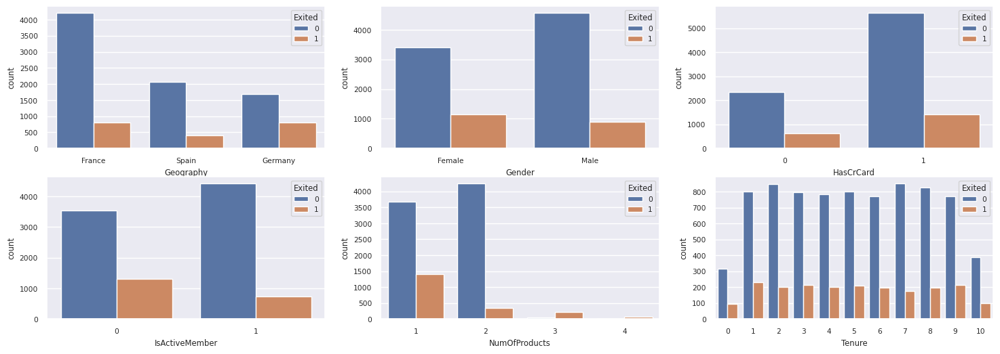

In [ ]:
# Memanggil fungsi show_dependent_variable
show_dependent_variable(df)

##### Insights 💡

1. **Ketidakseimbangan Kelas:**
    - Terdapat ketidakseimbangan yang signifikan antara kategori 0 (tidak keluar) dan 1 (keluar).
    - Jumlah observasi yang termasuk dalam kategori 0 (tidak keluar) jauh lebih banyak (7963) daripada jumlah observasi yang termasuk dalam kategori 1 (keluar) yang lebih sedikit (2037).

2. **Faktor Geografi:**
    - Mayoritas pelanggan bank tidak berhenti berlangganan.
    - Pelanggan dari Jerman memiliki tingkat retensi pelanggan yang lebih tinggi daripada pelanggan dari Prancis dan Spanyol.

3. **Faktor Gender:**
    - Mayoritas pelanggan bank tidak berhenti berlangganan.
    - Nasabah perempuan lebih cenderung untuk tetap menjadi nasabah bank (Exited = 0), sedangkan nasabah laki-laki lebih cenderung untuk keluar (Exited = 1).

4. **Faktor Kepemilikan Kartu Kredit:**
    - Mayoritas orang yang berhenti berlangganan adalah orang yang tidak memiliki kartu kredit.
    - Sekitar 10% orang yang keluar adalah orang yang memiliki kartu kredit. Hal ini menunjukkan bahwa orang yang memiliki kartu kredit juga memiliki kemungkinan untuk keluar dari layanan.
    - Ada perbedaan yang signifikan antara jumlah orang yang keluar berdasarkan kepemilikan kartu kredit. Orang yang tidak memiliki kartu kredit memiliki kemungkinan 5 kali lebih tinggi untuk keluar dari layanan daripada orang yang memiliki kartu kredit.

5. **Faktor Keaktifan Anggota:**
    - Sebagian besar anggota tetap aktif menggunakan layanan atau produk yang ditawarkan oleh perusahaan.
    - Anggota yang tidak aktif lebih berisiko keluar dari layanan atau produk yang ditawarkan oleh perusahaan.

6. **Faktor Jumlah Produk Yang Dibeli:**
    - Mayoritas nasabah yang keluar dari bank tersebut adalah nasabah yang hanya membeli 1 produk.
    - Nasabah yang membeli lebih dari 2 produk memiliki kemungkinan yang lebih kecil untuk keluar dari bank tersebut.

7. **Faktor Masa Berlangganan:**
    - Mayoritas pelanggan yang keluar (exited) memiliki masa berlangganan (tenure) selama 0 tahun.
    - Pelanggan yang baru mulai berlangganan memiliki kemungkinan lebih tinggi untuk keluar dalam jangka waktu 1 tahun.  

#### 2.3.2. Numeric columns distribution observation

In [ ]:
# Menampilkan distribusi variabel numerik dalam DataFrame
def show_numeric_columns_distributions(df):
    # Memilih kolom-kolom numerik dari DataFrame
    numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
    df_num_cols = df.select_dtypes(include=numerics)

    # Menyusun kolom-kolom numerik untuk ditampilkan
    columns = df_num_cols.columns[: len(df_num_cols.columns)]

    # Membuat plot distribusi untuk setiap kolom numerik
    fig = plt.figure()
    fig.set_size_inches(18, 15)
    length = len(columns)
    for i, j in itertools.zip_longest(columns, range(length)):
        plt.subplot(int(length / 2), 3, j + 1)
        plt.subplots_adjust(wspace=0.2, hspace=0.5)
        df_num_cols[i].hist(bins=20, edgecolor='black')
        plt.title(i)

    # Menampilkan judul keseluruhan
    fig = fig.suptitle('Struktur Variabel Numerik', color='r', fontsize=18)
    plt.show()

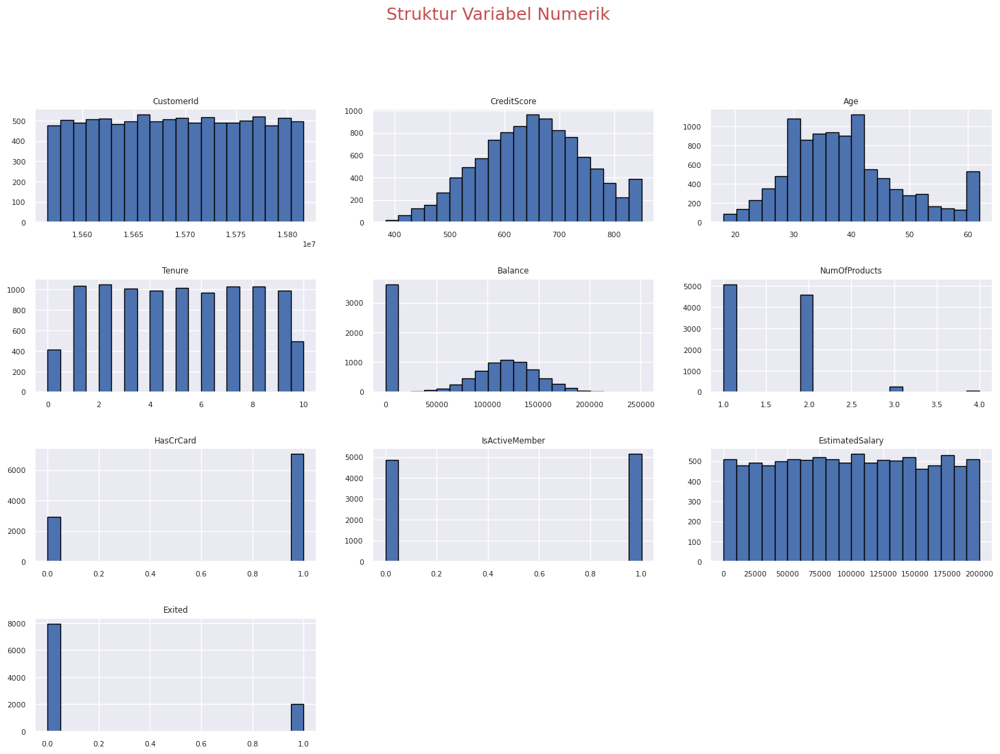

In [ ]:
# Memanggil fungsi show_numeric_columns_distributions
show_numeric_columns_distributions(df)

##### Insights 💡

1. **CreditScore:**
    - Rata-rata skor kredit adalah antara 600 dan 800. Ini berarti bahwa sebagian besar orang dalam kelompok ini memiliki skor kredit yang baik atau sangat baik.
    - Ada penyebaran skor kredit yang luas. Ini berarti bahwa ada beberapa orang dalam kelompok ini yang memiliki skor kredit yang sangat rendah, dan beberapa orang yang memiliki skor kredit yang sangat tinggi.

2. **Age:**
    - Usia nasabah didominasi oleh kelompok usia 20-60 tahun. Kelompok usia ini memiliki jumlah nasabah sebanyak 800 orang, atau 80% dari total nasabah. Hal ini menunjukkan bahwa nasabah bank tersebut didominasi oleh kelompok usia produktif, yaitu usia yang masih bekerja dan memiliki penghasilan.
    - Kelompok usia 60-70 tahun memiliki jumlah nasabah sebanyak 200 orang, atau 20% dari total nasabah. Kelompok usia ini merupakan kelompok usia pensiun, yaitu usia yang sudah tidak bekerja dan memiliki penghasilan.

3. **Tenure:**
    - Mayoritas nasabah bank memiliki tenure kurang dari 2 tahun.
    - Terdapat peningkatan jumlah nasabah dengan tenure lebih dari 2 tahun.
    - Jumlah nasabah dengan tenure 6-8 tahun dan 8-10 tahun relatif kecil.

4. **Balance:**
    - Jumlah nasabah bank dengan balance 0 cukup signifikan. Hal ini menunjukkan bahwa masih banyak nasabah bank yang belum memiliki saldo di rekening banknya.
    - Nilai balance nasabah bank terdistribusi di rentang 0 hingga 250.000.

5. **NumOfProducts:**
    - Mayoritas nasabah bank hanya memiliki 1 produk.
    - Sangat sedikit nasabah bank yang memiliki 4 produk.
  
6. **HasCrCard:**
    - Mayoritas nasabah bank memiliki kartu kredit. Hal ini terlihat dari jumlah nasabah yang memiliki kartu kredit (HasCrCard = 1) yang lebih tinggi daripada jumlah nasabah yang tidak memiliki kartu kredit (HasCrCard = 0).

7. **isActiveMember:**
    - Mayoritas nasabah merupakan anggota aktif.
    - Jumlah nasabah bank yang bukan merupakan anggota aktif juga cukup tinggi.

8. **EstimatedSalary:**
    - Mayoritas nasabah bank memiliki estimated salary di bawah $100,000. Hal ini terlihat dari jumlah baris yang lebih banyak di bawah $100,000.
    - Median estimated salary nasabah bank adalah $100,000. Hal ini terlihat dari baris yang paling tinggi berada di angka $100,000.
    - Jumlah nasabah bank dengan estimated salary di atas $100,000 cukup banyak, tetapi tidak sebanyak nasabah bank dengan estimated salary di bawah $100,000. Hal ini terlihat dari jumlah baris yang lebih sedikit di atas $100,000.

9. **Exited:**
    - Mayoritas nasabah bank tetap berlangganan dengan layanan yang disediakan bank.
    - Hanya sedikit nasabah bank yang keluar dari layanan yang disediakan bank.

#### 2.3.3. Status of other variables according to dependent variable

In [ ]:
# Menampilkan distribusi variabel dependen terhadap variabel lainnya
def show_dependent_variable_cross_others_distributions(df):
    # Menentukan tipe data numerik
    numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']

    # Memfilter baris dengan nilai variabel dependen sama dengan 1
    df_dependent_var = df[df[dependent_variable_name]==1]

    # Memilih kolom-kolom numerik dari data yang telah difilter
    df_num_cols = df_dependent_var.select_dtypes(include=numerics)

    # Mengambil nama kolom-kolom numerik
    columns = df_num_cols.columns[:len(df_num_cols.columns)]

    # Membuat objek plot dengan ukuran tertentu
    fig = plt.figure()
    fig.set_size_inches(18, 15)

    # Mendapatkan panjang kolom
    length = len(columns)

    # Menampilkan histogram untuk setiap kolom numerik
    for i, j in itertools.zip_longest(columns, range(length)):
        plt.subplot(int(length/2), 3, j+1)
        plt.subplots_adjust(wspace=0.2, hspace=0.5)
        df_num_cols[i].hist(bins=20, edgecolor='black')
        plt.title(i)

    # Menambahkan judul keseluruhan plot
    fig = fig.suptitle(dependent_variable_name + ' Status of other variables according to 1 dependent variable', color='r', fontsize=18)

    # Menampilkan plot
    plt.show()

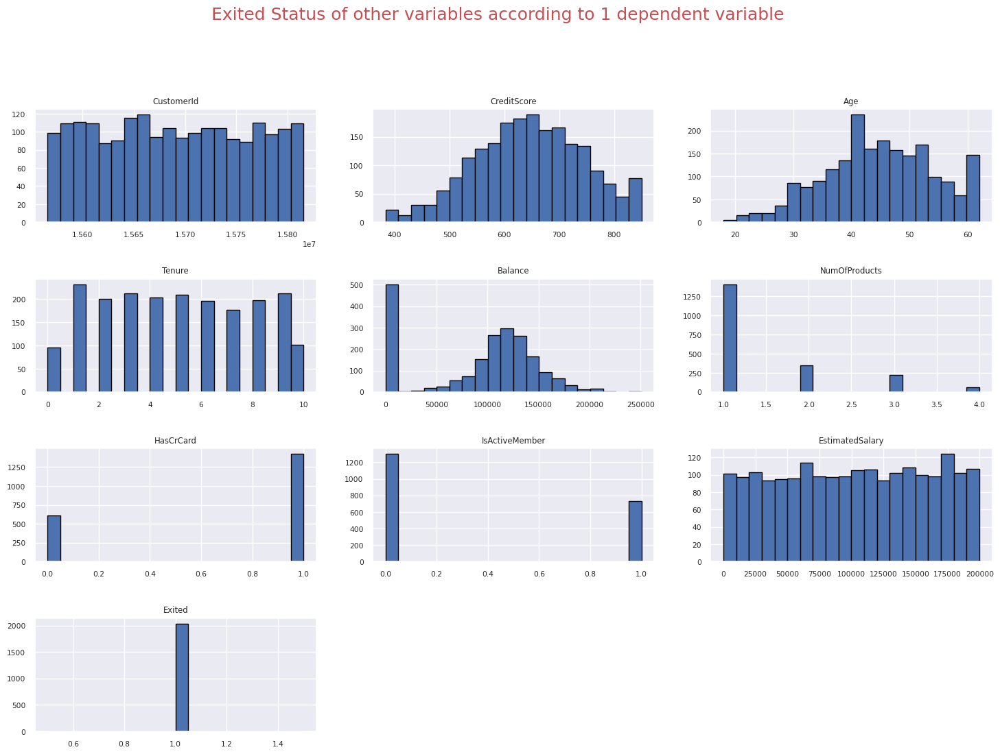

In [ ]:
# Memanggil fungsi show_dependent_variable_cross_others_distributions
show_dependent_variable_cross_others_distributions(df)

#### 2.3.4. Categorical variables are observed according to the dependent variable

In [ ]:
# Menampilkan distribusi variabel kategorikal terhadap variabel dependen
def show_dependent_variable_cross_categorical_distributions(df, categorical_columns):
    # Mengatur skala font seaborn
    sns.set(font_scale=0.7)

    # Membuat subplot berdasarkan jumlah kolom kategorikal
    fig, axes = plt.subplots(
        nrows=int(len(categorical_columns)/2),
        ncols=2,
        figsize=(7, 9)
    )

    # Menyesuaikan tata letak subplot
    fig.tight_layout()

    # Menampilkan plot count untuk setiap kolom kategorikal
    for ax, col in zip(axes.flatten(), categorical_columns):
        sns.countplot(x=df[col], hue=dependent_variable_name, data=df, ax=ax)

    # Menambahkan judul keseluruhan plot
    fig.suptitle('Categorical variables are monitored according to the dependent variable', color='r', fontsize=1)

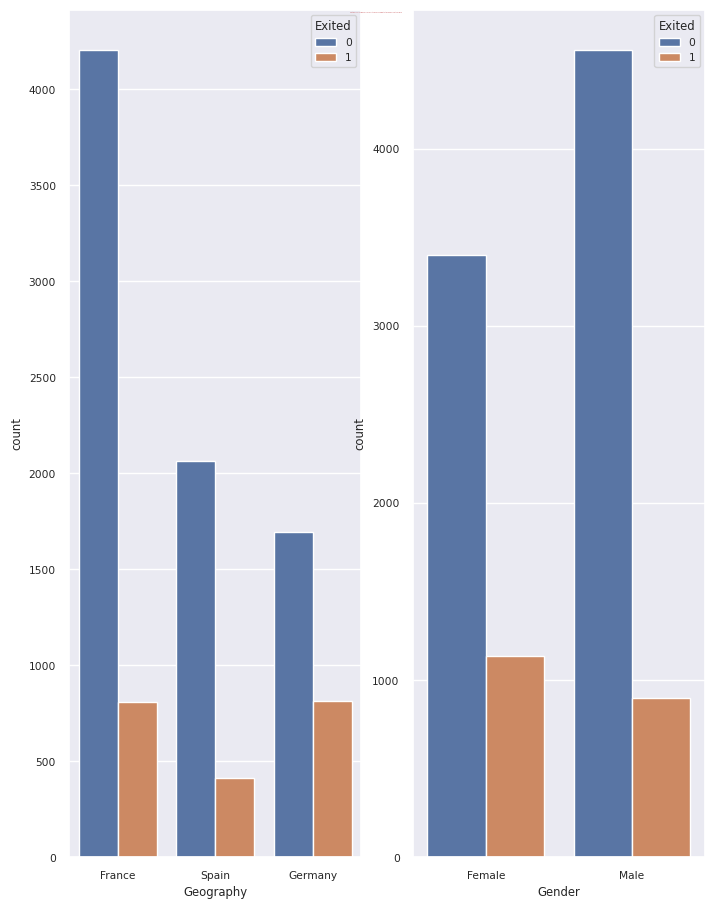

In [ ]:
categorical_columns = ['Geography', 'Gender']

# Memanggil fungsi show_dependent_variable_cross_categorical_distributions
show_dependent_variable_cross_categorical_distributions(df, categorical_columns)

##### Insights 💡

1. Terdapat perbedaan yang signifikan dalam jumlah orang yang keluar dari bank antara orang-orang yang berasal dari Prancis dan Jerman dengan orang-orang yang berasal dari Spanyol.

2. Orang-orang yang berasal dari Prancis lebih banyak yang tidak keluar dari bank daripada orang-orang yang berasal dari Spanyol atau Jerman.

3. Nasabah perempuan lebih banyak yang keluar dari bank dibandingkan nasabah laki-laki. Nasabah laki-laki lebih banyak yang tidak keluar dari bank.


#### 2.3.5. The main method that started all data analysis

In [ ]:
# Menampilkan analisis data secara menyeluruh
def show_data_analysis(df):
    # Menampilkan informasi variabel dependen
    show_dependent_variable(df)

    # Menampilkan distribusi kolom-kolom numerik
    show_numeric_columns_distributions(df)

    # Menampilkan distribusi variabel dependen terhadap variabel lainnya
    show_dependent_variable_cross_others_distributions(df)

    # Menampilkan distribusi variabel kategorikal terhadap variabel dependen
    show_dependent_variable_cross_categorical_distributions(
        df,
        categorical_columns=["Gender", "Geography"]
    )

Distribusi variabel tergantung:
Exited 0 count: 7963
Exited 1 count: 2037


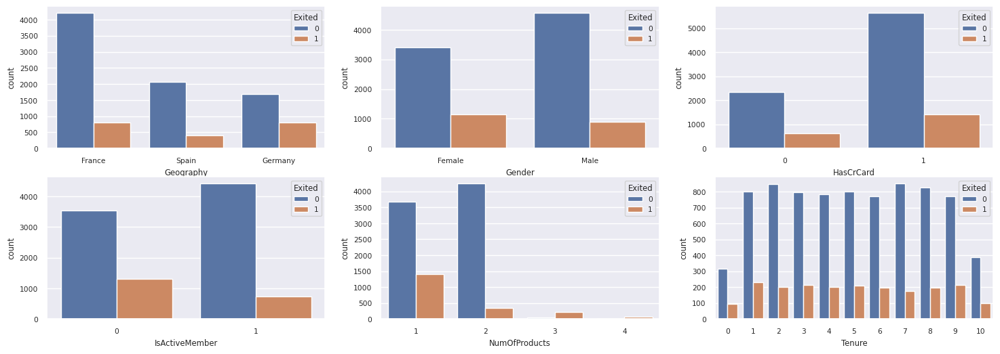

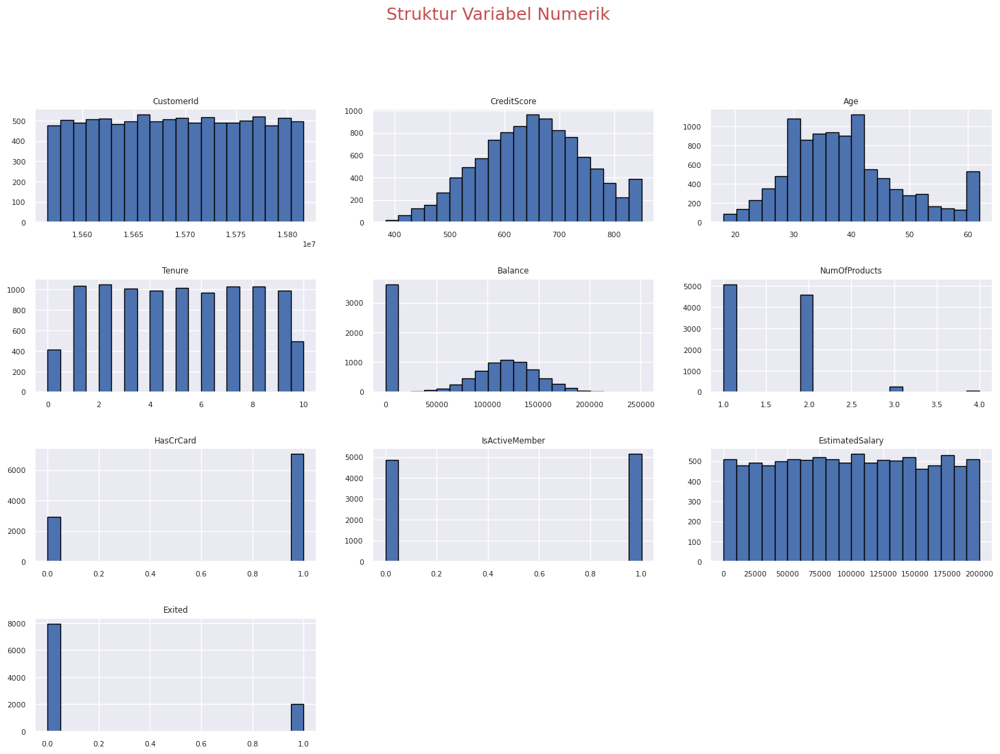

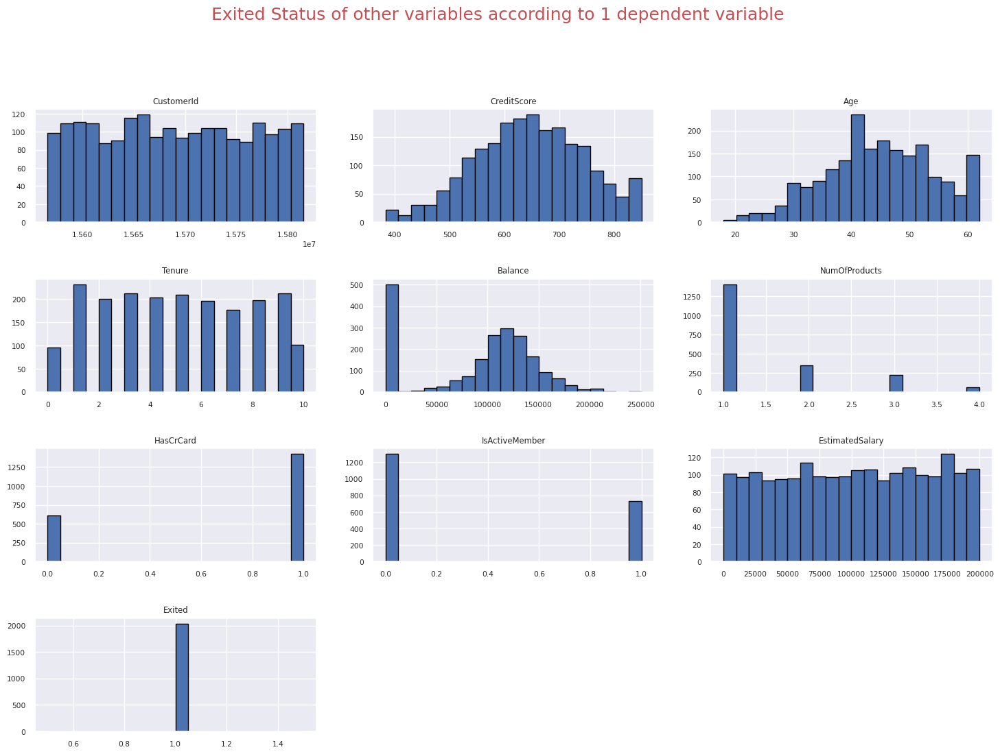

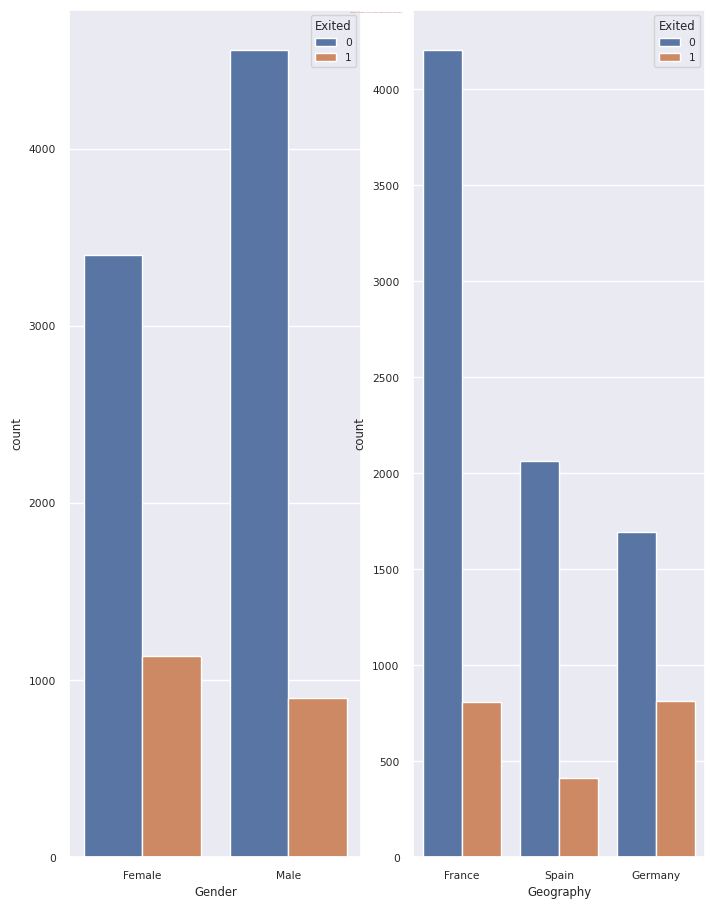

In [ ]:
# Memanggil fungsi show_data_analysis
show_data_analysis(df)

# 3.&nbsp;Feature Engineering

In [ ]:
# Menghasilkan klasifikasi skor kredit berdasarkan CreditScore
def credit_score_table(row):
    credit_score = row.CreditScore

    # Klasifikasi skor kredit berdasarkan rentang nilai
    if credit_score < 300:
        return "Deep"
    elif 300 <= credit_score < 500:
        return "Very_Poor"
    elif 500 <= credit_score < 601:
        return "Poor"
    elif 601 <= credit_score < 661:
        return "Fair"
    elif 661 <= credit_score < 781:
        return "Good"
    elif 781 <= credit_score < 851:
        return "Excellent"
    else:
        return "Top"

### 3.2. Product utilization RATE by YEAR

In [ ]:
# Menghitung tingkat pemanfaatan produk berdasarkan jumlah produk dan masa tenur
def product_utilization_rate_by_year(row):
    number_of_products = row.NumOfProducts
    tenure = row.Tenure

    # Jika jumlah produk adalah 0, tingkat pemanfaatan adalah 0
    if number_of_products == 0:
        return 0

    # Jika masa tenur adalah 0, tingkat pemanfaatan adalah jumlah produk
    if tenure == 0:
        return number_of_products

    # Menghitung tingkat pemanfaatan berdasarkan jumlah produk dan masa tenur
    rate = number_of_products / tenure
    return rate

### 3.3. Product utilization rate by estimated SALARY

In [ ]:
# Menghitung tingkat pemanfaatan produk berdasarkan jumlah produk dan gaji perkiraan
def product_utilization_rate_by_estimated_salary(row):
    number_of_products = row.NumOfProducts
    estimated_salary = row.EstimatedSalary

    # Jika jumlah produk adalah 0, tingkat pemanfaatan adalah 0
    if number_of_products == 0:
        return 0

    # Menghitung tingkat pemanfaatan berdasarkan jumlah produk dan gaji perkiraan
    rate = number_of_products / estimated_salary
    return rate

### 3.4. According to countries monthly average salaries

reference: [Link](https://colab.research.google.com/drive/16-5XMNkJf8tPWw5L908_T-hpIwWlBkDw#scrollTo=pGT8KGG8b7LP&line=1&uniqifier=1)

In [ ]:
# Menghitung rata-rata gaji bulanan berdasarkan negara (Germany, France, dan Spain)
def countries_monthly_average_salaries(row):
    # Pengukuran rata-rata gaji bulanan untuk setiap negara
    fr = 3696  # Gaji rata-rata bulanan di Perancis
    de = 4740  # Gaji rata-rata bulanan di Jerman
    sp = 2257  # Gaji rata-rata bulanan di Spanyol

    # Menghitung gaji bulanan berdasarkan gaji tahunan
    salary = row.EstimatedSalary / 12
    country = row.Geography  # Negara (Germany, France, atau Spain)

    # Menghitung rata-rata gaji bulanan berdasarkan negara
    if country == 'Germany':
        return salary / de
    elif country == "France":
        return salary / fr
    elif country == "Spain":
        return salary / sp

### 3.5. The main method that started all Feature Engineering

In [ ]:
# Melakukan feature engineering pada DataFrame
def feature_engineering(df, is_show_graph=False):
    # Membuat salinan DataFrame
    df_fe = df.copy()

    # Menambahkan kolom balance_salary_rate
    balance_salary_rate = 'balance_salary_rate'
    df_fe[balance_salary_rate] = df_fe.Balance / df_fe.EstimatedSalary

    # Menambahkan kolom product_utilization_rate_by_year
    df_fe = df_fe.assign(
        product_utilization_rate_by_year=df_fe.apply(
            lambda x: product_utilization_rate_by_year(x),
            axis=1
        )
    )

    # Menambahkan kolom tenure_rate_by_age
    tenure_rate_by_age = 'tenure_rate_by_age'
    df_fe[tenure_rate_by_age] = df_fe.Tenure / (df_fe.Age - 17)

    # Menambahkan kolom credit_score_rate_by_age
    credit_score_rate_by_age = 'credit_score_rate_by_age'
    df_fe[credit_score_rate_by_age] = df_fe.CreditScore / (df_fe.Age - 17)

    # Menambahkan kolom product_utilization_rate_by_salary
    product_utilization_rate_by_salary = 'product_utilization_rate_by_salary'

    # Menambahkan kolom credit_score_rate_by_salary
    credit_score_rate_by_salary = 'credit_score_rate_by_salary'
    df_fe[credit_score_rate_by_salary] = df_fe.CreditScore / df_fe.EstimatedSalary

    # Menampilkan grafik boxplot jika is_show_graph bernilai True
    if is_show_graph:
        fig, axes = plt.subplots(
            nrows=2, ncols=2, figsize=(20, 12))
        fig.tight_layout()
        sns.boxplot(
            y=balance_salary_rate,
            x=dependent_variable_name,
            hue=dependent_variable_name,
            data=df_fe,
            ax=axes[0][0]
        )
        sns.boxplot(
            y=product_utilization_rate_by_year,
            x=dependent_variable_name,
            hue=dependent_variable_name,
            data=df_fe,
            ax=axes[0][1]
        )
        plt.ylim(-1, 5)

    # Menambahkan kolom credit_score_table
    df_fe = df_fe.assign(credit_score_table=df_fe.apply(lambda x: credit_score_table(x), axis=1))

    # Menambahkan kolom countries_monthly_average_salaries
    df_fe = df_fe.assign(countries_monthly_average_salaries=df_fe.apply(lambda x: countries_monthly_average_salaries(x), axis=1))

    # Mengembalikan DataFrame yang telah diubah
    return df_fe

In [ ]:
# Memanggil fungsi feature_engineering
result_df = feature_engineering(df, is_show_graph=False)

# Menampilkan beberapa baris pertama dari DataFrame hasil feature engineering
result_df.head()

,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,balance_salary_rate,product_utilization_rate_by_year,tenure_rate_by_age,credit_score_rate_by_age,credit_score_rate_by_salary,credit_score_table,countries_monthly_average_salaries
RowNumber,,,,,,,,,,,,,,,,,,,,
1,15634602,Hargrave,619,France,Female,42,2,0.00,1,1,1,101348.88,1,0.00,0.50,0.08,24.76,0.01,Fair,2.29
2,15647311,Hill,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0,0.74,1.00,0.04,25.33,0.01,Fair,4.16
3,15619304,Onio,502,France,Female,42,8,159660.80,3,1,0,113931.57,1,1.40,0.38,0.32,20.08,0.00,Poor,2.57
4,15701354,Boni,699,France,Female,39,1,0.00,2,0,0,93826.63,0,0.00,2.00,0.05,31.77,0.01,Good,2.12
5,15737888,Mitchell,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0,1.59,0.50,0.08,32.69,0.01,Excellent,2.92


# 4.&nbsp;Data Encoding

In [ ]:
def data_encoding(df):
    # Membuat salinan DataFrame
    df_model = df.copy()
    # >>>> Kolom Kategorikal <<<<<
    non_encoding_columns = [
        "Geography", "HasCrCard", "IsActiveMember",
        "Gender", "NumOfProducts", "Tenure", "credit_score_table"]

    # Mengambil subset DataFrame dengan kolom non-kategorikal
    df_non_encoding = df_model[non_encoding_columns]
    # Menghapus kolom non-kategorikal dari df_model
    df_model = df_model.drop(non_encoding_columns, axis=1)
    # Membuat salinan DataFrame untuk encoding
    df_encoding = df_non_encoding.copy()

    # Membuat objek LabelEncoder
    encoder = LabelEncoder()
    # Melakukan encoding
    # Q1 (15 Poin)
    # Iterasi melalui kolom-kolom pada df_encoding
    for col in df_encoding.columns:
        df_encoding[col] = encoder.fit_transform(df_encoding[col])

    # Mereset indeks DataFrame encoding dan df_model
    df_encoding.reset_index(drop=True, inplace=True)
    df_model.reset_index(drop=True, inplace=True)
    # Menggabungkan df_model dan df_encoding menjadi satu DataFrame
    df_model = pd.concat([df_model, df_encoding], axis=1)

    # Menghapus kolom yang tidak diperlukan setelah encoding
    df_model = df_model.drop(
        ["Geography", "Gender", "CustomerId", "Surname",
         "credit_score_table", "CreditScore", "EstimatedSalary"],
        axis=1)

    # Mereset indeks DataFrame hasil encoding
    df_model = df_model.reset_index()
    df_model = df_model.drop('index', axis=1)

    # Menambahkan kolom credit_card_situation dan is_active_member dengan nilai -1
    df_model.loc[df_model.HasCrCard == 0, 'credit_card_situation'] = -1
    df_model.loc[df_model.HasCrCard == 1, 'credit_card_situation'] = 1
    df_model.loc[df_model.IsActiveMember == 0, 'is_active_member'] = -1
    df_model.loc[df_model.IsActiveMember == 1, 'is_active_member'] = 1

    return df_model

In [ ]:
# Memanggil fungsi data_encoding
encoded_df = data_encoding(result_df)

# Menampilkan beberapa baris pertama dari DataFrame hasil feature engineering
encoded_df.head()

,Age,Balance,Exited,balance_salary_rate,product_utilization_rate_by_year,tenure_rate_by_age,credit_score_rate_by_age,credit_score_rate_by_salary,countries_monthly_average_salaries,HasCrCard,IsActiveMember,NumOfProducts,Tenure,credit_card_situation,is_active_member
0,42,0.00,1,0.00,0.50,0.08,24.76,0.01,2.29,1,1,0,2,1.00,1.00
1,41,83807.86,0,0.74,1.00,0.04,25.33,0.01,4.16,0,1,0,1,-1.00,1.00
2,42,159660.80,1,1.40,0.38,0.32,20.08,0.00,2.57,1,0,2,8,1.00,-1.00
3,39,0.00,0,0.00,2.00,0.05,31.77,0.01,2.12,0,0,1,1,-1.00,-1.00
4,43,125510.82,0,1.59,0.50,0.08,32.69,0.01,2.92,1,1,0,2,1.00,1.00


# 5.&nbsp;Model Preparation

In [ ]:
def model_prepare(df_model):
    # Memisahkan variabel dependen (y) dan variabel independen (X)
    y = df_model[dependent_variable_name]
    X = df_model.loc[:, df_model.columns != dependent_variable_name]

    # Split data menjadi data latih (train) dan data uji (test)
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Standarisasi data menggunakan Standard Scaler
    sc = StandardScaler()
    X_train = sc.fit_transform(X_train)
    X_test = sc.transform(X_test)

    return X_train, X_test, y_train, y_test

In [ ]:
df_model = encoded_df

# Memanggil fungsi model_prepare
X_train, X_test, y_train, y_test = model_prepare(df_model)
X_train, X_test, y_train, y_test

(array([[-6.78553026e-01, -1.21847056e+00, -1.33122929e-01, ...,
          3.45679664e-01,  6.49202671e-01,  9.74816989e-01],
        [ 3.44153545e-01,  6.96837655e-01, -1.03369816e-01, ...,
         -3.48369103e-01,  6.49202671e-01,  9.74816989e-01],
        [-1.49671828e+00,  6.18629095e-01, -6.80068969e-02, ...,
         -6.95393486e-01,  6.49202671e-01, -1.02583358e+00],
        ...,
        [-6.49290834e-02, -1.21847056e+00, -1.33122929e-01, ...,
         -1.38944225e+00, -1.54035103e+00, -1.02583358e+00],
        [ 4.46424202e-01,  1.82725930e+00, -3.80287510e-02, ...,
          1.03972843e+00,  6.49202671e-01, -1.02583358e+00],
        [ 1.26458946e+00,  1.14971970e+00,  1.43447976e-03, ...,
         -1.38944225e+00,  6.49202671e-01,  9.74816989e-01]]),
 array([[-0.67855303,  0.32993735, -0.02031674, ..., -0.69539349,
         -1.54035103, -1.02583358],
        [ 0.4464242 , -1.21847056, -0.13312293, ..., -1.38944225,
          0.64920267,  0.97481699],
        [ 0.54869486, -1.

### 5.1 Part of Data Train

In [ ]:
def data_training(X_train, X_test, y_train, y_test):
    # Inisialisasi berbagai model klasifikasi
    models = []
    models.append(('LOGR', LogisticRegression()))
    models.append(('KNN', KNeighborsClassifier()))
    models.append(('CART', DecisionTreeClassifier()))
    models.append(('RF', RandomForestClassifier()))
    models.append(('GBM', GradientBoostingClassifier()))
    models.append(('XGBoost', XGBClassifier()))
    models.append(('LightGBM', LGBMClassifier()))

    # Kolom hasil evaluasi model
    res_cols = ['model', 'accuracy_score', 'scale_method', "0_precision", "0_recall", "1_precision", "1_recall"]
    df_result = pd.DataFrame(columns=res_cols)

    # Iterasi melalui setiap model
    for name, model in models:
        # Melatih model dengan data latih
        model.fit(X_train, y_train)
        # Memprediksi label menggunakan data uji
        y_pred = model.predict(X_test)
        # Menghitung akurasi model
        score = accuracy_score(y_test, y_pred)
        # Menghasilkan laporan klasifikasi
        class_report = classification_report(y_test, y_pred, digits=2, output_dict=True)
        zero_report = class_report['0']
        one_report = class_report['1']
        # Menyimpan hasil evaluasi model ke dalam DataFrame
        df_result = df_result.append({
            'model': name,
            'accuracy_score': score,
            'scale_method': "NA",
            '0_precision': zero_report['precision'],
            '0_recall': zero_report['recall'],
            '1_precision': one_report['precision'],
            '1_recall': one_report['recall']
        }, ignore_index=True)

    # Mengurutkan hasil evaluasi berdasarkan akurasi secara menurun
    return df_result.sort_values("accuracy_score", ascending=False)

In [ ]:
# Memanggil fungsi data_training
hasil_evaluasi = data_training(X_train, X_test, y_train, y_test)

# Menampilkan hasil evaluasi model
hasil_evaluasi.head()

[LightGBM] [Info] Number of positive: 1644, number of negative: 6356
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000725 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1615
[LightGBM] [Info] Number of data points in the train set: 8000, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.205500 -> initscore=-1.352267
[LightGBM] [Info] Start training from score -1.352267


,model,accuracy_score,scale_method,0_precision,0_recall,1_precision,1_recall
4,GBM,0.86,NA,0.87,0.96,0.74,0.44
6,LightGBM,0.86,NA,0.88,0.96,0.72,0.45
3,RF,0.86,NA,0.87,0.96,0.73,0.43
5,XGBoost,0.85,NA,0.88,0.94,0.67,0.46
1,KNN,0.84,NA,0.87,0.94,0.63,0.43


In [ ]:
# Berdasarkan saran dari output LightGBM, dilakukan pengoptimalan penggunaan memori
lgb_params = {
    'force_col_wise': True,
}

# Inisialisasi model LightGBM dengan parameter yang diperbarui
lightgbm_model = LGBMClassifier(**lgb_params)

# Optimasi hyperparameter
param_grid = {
    'learning_rate': [0.01, 0.1, 0.2],
    'n_estimators': [50, 100, 200],
}

grid_search = GridSearchCV(lightgbm_model, param_grid, scoring='accuracy', cv=3)

# Menyesuaikan model dengan data pelatihan
grid_search.fit(X_train, y_train)

# Model terbaik dari optimasi hyperparameter
best_lightgbm_model = grid_search.best_estimator_

# Menyesuaikan model terbaik dengan data pelatihan
best_lightgbm_model_fit = best_lightgbm_model.fit(X_train, y_train)

# Evaluasi model LightGBM setelah optimasi hyperparameter
y_pred_lightgbm = best_lightgbm_model_fit.predict(X_test)
accuracy_lightgbm = accuracy_score(y_test, y_pred_lightgbm)
class_report_lightgbm = classification_report(y_test, y_pred_lightgbm, digits=2)

# Output hasil evaluasi model LightGBM
print(f"LightGBM Accuracy: {accuracy_lightgbm}")
print("LightGBM Classification Report:")
print(class_report_lightgbm)

[LightGBM] [Info] Number of positive: 1096, number of negative: 4237
[LightGBM] [Info] Total Bins 1610
[LightGBM] [Info] Number of data points in the train set: 5333, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.205513 -> initscore=-1.352188
[LightGBM] [Info] Start training from score -1.352188
[LightGBM] [Info] Number of positive: 1096, number of negative: 4237
[LightGBM] [Info] Total Bins 1611
[LightGBM] [Info] Number of data points in the train set: 5333, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.205513 -> initscore=-1.352188
[LightGBM] [Info] Start training from score -1.352188
[LightGBM] [Info] Number of positive: 1096, number of negative: 4238
[LightGBM] [Info] Total Bins 1613
[LightGBM] [Info] Number of data points in the train set: 5334, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.205474 -> initscore=-1.352424
[LightGBM] [Info] Start training from score -1.352424
[LightGBM] [I

##### Insights 💡

Dengan akurasi sebesar 85%, model LightGBM telah menunjukkan peningkatan dari hasil sebelumnya yang tertinggi sebesar 86%.

1. **Trade-off Precision dan Recall:**
   - Precision dan recall untuk kelas 0 meningkat, menunjukkan model dapat memprediksi kelas ini dengan lebih baik.
   - Namun, kelas 1 mengalami penurunan recall, yang dapat mengindikasikan bahwa model mungkin kurang peka.

2. **F1-Score:**
   - F1-score untuk kelas 1 juga mengalami penurunan, mencerminkan keseimbangan antara precision dan recall.

3. **Analisis Macro Avg dan Weighted Avg:**
   - Meskipun ada peningkatan pada weighted avg, makro avg menunjukkan kinerja yang relatif stabil.

# 6.&nbsp;HELPER Functions

In [ ]:
# Fungsi untuk memberikan skor dan parameter terbaik dari model
def best_model(model):
    print(model.best_score_)
    print(model.best_params_)
    print(model.best_estimator_)

# Fungsi untuk mendapatkan skor AUC
def get_auc_scores(y_actual, method, method2):
    auc_score = roc_auc_score(y_actual, method)
    fpr_df, tpr_df, _ = roc_curve(y_actual, method2)
    return (auc_score, fpr_df, tpr_df)

# Fungsi untuk menampilkan confusion matrix
from matplotlib import rc, rcParams
def plot_confusion_matrix(
    cm, classes,
    normalize=False,
    title='Confusion Matrix',
    cmap=plt.cm.Blues):
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    plt.rcParams.update({'font.size': 16})
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45, color="blue")
    plt.yticks(tick_marks, classes, color="blue")

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="red" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

NameError: ignored

In [ ]:
# Model terbaik dari hasil GridSearchCV
best_model(grid_search)

##### Insights 💡
Insights dari hasil output tersebut adalah sebagai berikut:

1. **Akurasi Terbaik (Best Accuracy):** 0.8567 atau 85.67%
   - Ini adalah nilai akurasi terbaik yang dicapai oleh model.

2. **Hyperparameter Terbaik:**
   - `learning_rate`: 0.01
   - `n_estimators`: 200
   - Ini adalah nilai hyperparameter terbaik yang dipilih selama proses pencarian grid.

3. **Model Terbaik:**
   - Model terbaik yang dihasilkan adalah `LGBMClassifier` dengan hyperparameter terbaik.
   - Hyperparameter tersebut adalah `force_col_wise=True`, `learning_rate=0.01`, dan `n_estimators=200`.

Poin ini memberikan gambaran tentang konfigurasi hyperparameter yang memberikan kinerja terbaik pada model LightGBM.

# 7.&nbsp;Data Cleaning

### 7.1 Preparation and Outlier Handling

No Missing Value


CustomerId
			:10000
Surname
			:2932
CreditScore
			:450
Geography
			:3
Gender
			:2
Age
			:45
Tenure
			:11
Balance
			:6382
NumOfProducts
			:4
HasCrCard
			:2
IsActiveMember
			:2
EstimatedSalary
			:9999
Exited
			:2
When age is below lower score: 14.0 and above upper score: 62.0
When credit score is below lower score: 383.0 and above upper score: 919.0


<ipython-input-11-d1915443266f>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["Age"][df_outlier.index] = upper
<ipython-input-11-d1915443266f>:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["CreditScore"][df_outlier.index] = lower


Distribusi variabel tergantung:
Exited 0 count: 7963
Exited 1 count: 2037


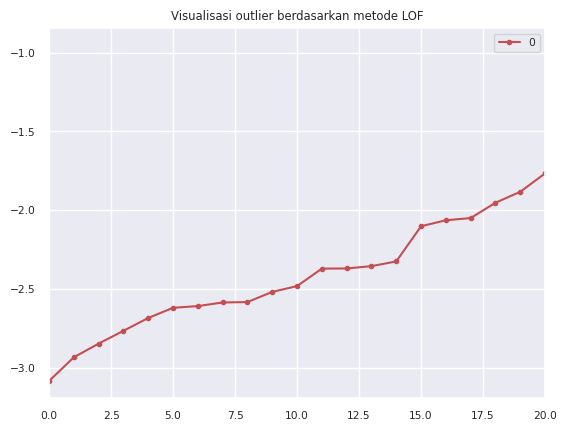

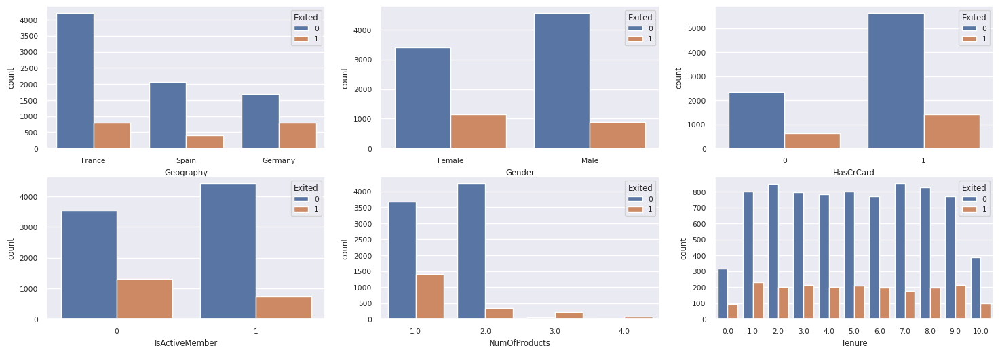

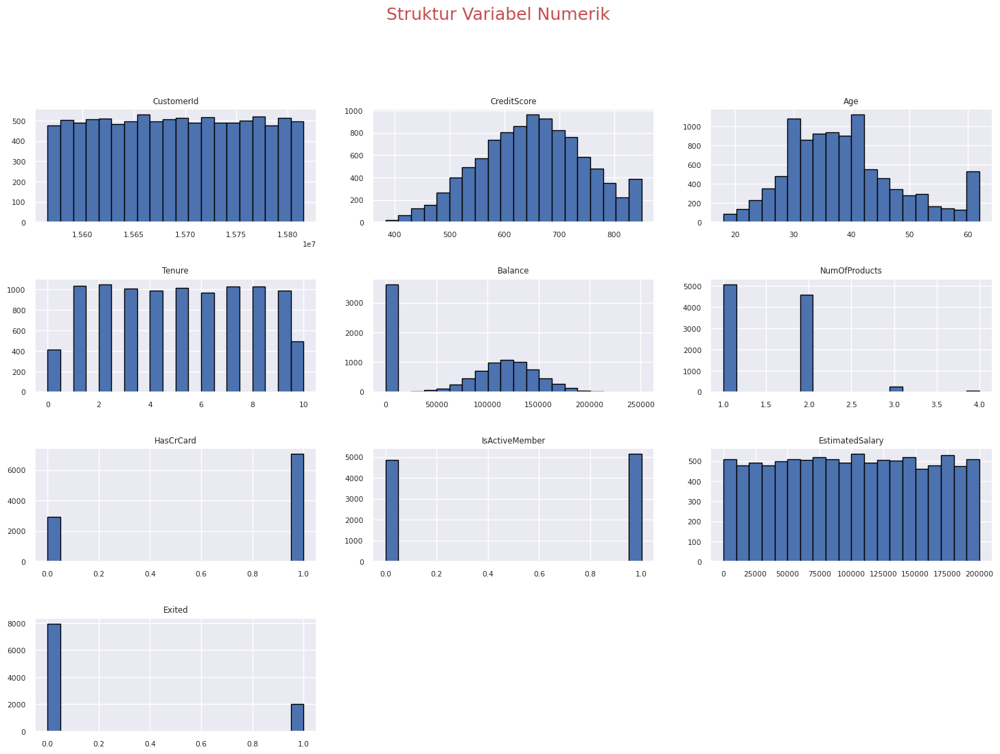

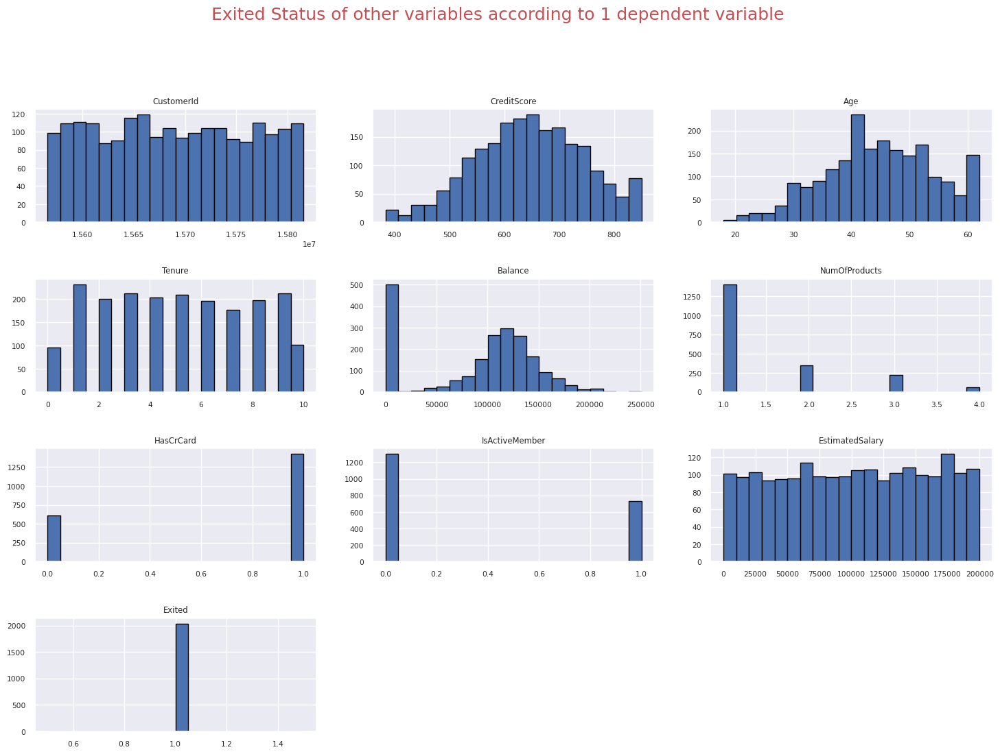

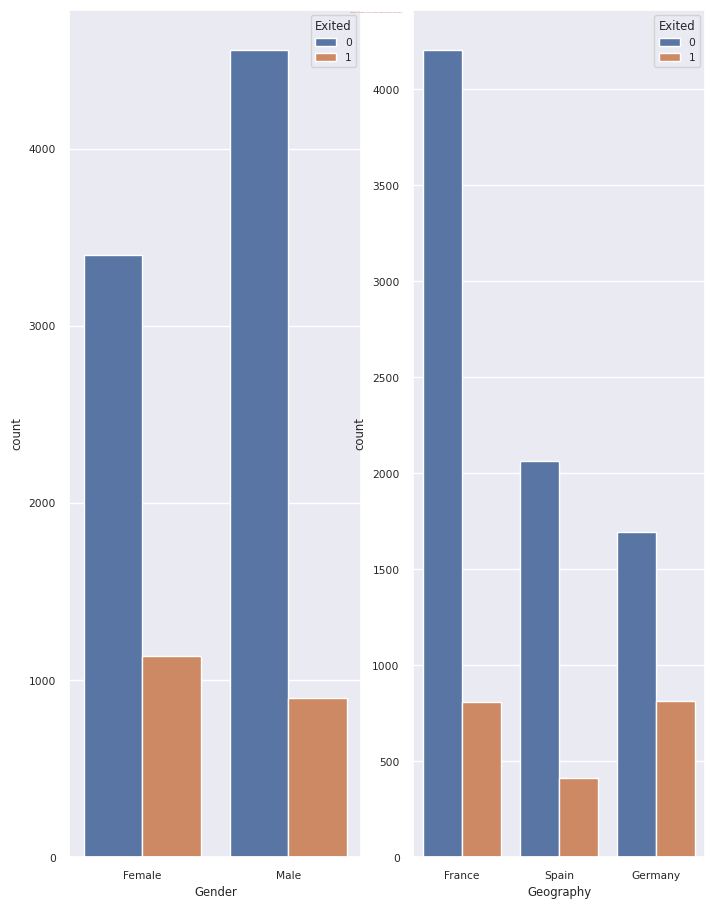

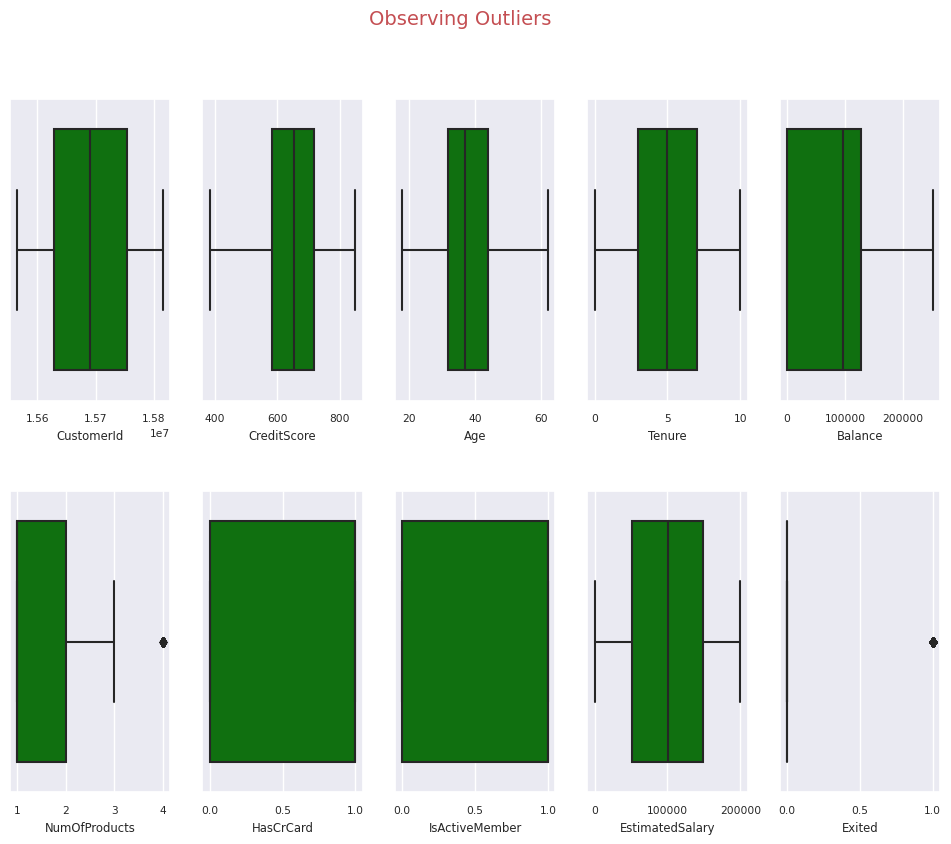

In [ ]:
# Memproses data dan menyiapkan DataFrame
df_prep = data_prepare()

# Mengatasi outlier pada DataFrame yang telah diproses
df_outlier = outlier_process(df=df_prep)

# Menampilkan analisis data dan visualisasi outliers
show_data_analysis(df_prep)
show_outliers(df=df_outlier)

Let's see after feature engineering:

In [ ]:
# Melakukan feature engineering pada DataFrame yang telah diproses outliers
df_fe = feature_engineering(df=df_outlier)

# Menampilkan tiga baris pertama dari DataFrame hasil feature engineering
df_fe.head(3)

,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,balance_salary_rate,product_utilization_rate_by_year,tenure_rate_by_age,credit_score_rate_by_age,credit_score_rate_by_salary,credit_score_table,countries_monthly_average_salaries
RowNumber,,,,,,,,,,,,,,,,,,,,
1,15634602,Hargrave,619,France,Female,42,2.00,0.00,1.00,1,1,101348.88,1,0.00,0.50,0.08,24.76,0.01,Fair,2.29
2,15647311,Hill,608,Spain,Female,41,1.00,83807.86,1.00,0,1,112542.58,0,0.74,1.00,0.04,25.33,0.01,Fair,4.16
3,15619304,Onio,502,France,Female,42,8.00,159660.80,3.00,1,0,113931.57,1,1.40,0.38,0.32,20.08,0.00,Poor,2.57


And see after data encoding:

In [ ]:
# Melakukan encoding pada DataFrame hasil feature engineering
df_encoded = data_encoding(df_fe)

# Menghapus kolom 'credit_card_situation' dan 'is_active_member' dari DataFrame hasil encoding
df_encoded.drop(
    columns=['credit_card_situation', 'is_active_member'], inplace=True)

# Menampilkan lima baris pertama dari DataFrame hasil encoding dan penghapusan kolom
df_encoded.head(5)

,Age,Balance,Exited,balance_salary_rate,product_utilization_rate_by_year,tenure_rate_by_age,credit_score_rate_by_age,credit_score_rate_by_salary,countries_monthly_average_salaries,HasCrCard,IsActiveMember,NumOfProducts,Tenure
0,42,0.00,1,0.00,0.50,0.08,24.76,0.01,2.29,1,1,0,2
1,41,83807.86,0,0.74,1.00,0.04,25.33,0.01,4.16,0,1,0,1
2,42,159660.80,1,1.40,0.38,0.32,20.08,0.00,2.57,1,0,2,8
3,39,0.00,0,0.00,2.00,0.05,31.77,0.01,2.12,0,0,1,1
4,43,125510.82,0,1.59,0.50,0.08,32.69,0.01,2.92,1,1,0,2


### 7.2 Correlation Graph

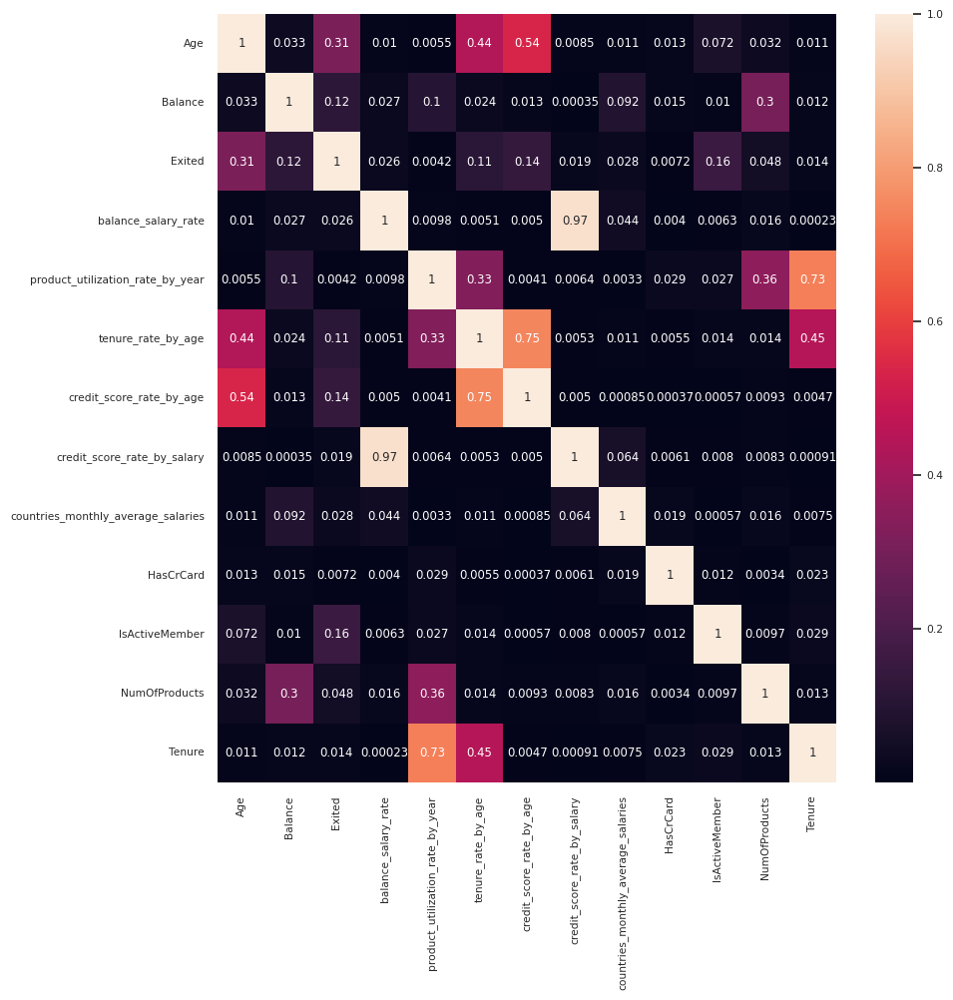

In [ ]:
# Menghitung nilai korelasi absolut antar kolom pada DataFrame hasil encoding
correlation = df_encoded.corr().abs()

# Menampilkan heatmap korelasi dengan nilai annotasi
plt.figure(figsize=(10, 10))
sns.heatmap(correlation, annot=True)
plt.show()

##### Insights 💡

Berdasarkan heatmap korelasi, dapat diperoleh beberapa insights berikut:

1. **Usia dan Lama Berlangganan**
    - Korelasi positif yang kuat (0.44)
    - Artinya, semakin tua usia nasabah, semakin lama mereka cenderung berlangganan layanan bank.

2. **Usia dan Skor Kredit**
    - Korelasi positif yang kuat (0.54)
    - Artinya, nasabah dengan usia lebih tua cenderung memiliki skor kredit yang lebih tinggi.

3. **Lama Berlangganan dan Durasi Pemakaian Produk**
    - Korelasi positif yang moderat (0.36)
    - Artinya, nasabah yang berlangganan lebih lama cenderung menggunakan lebih banyak produk bank.

4. **Aktivitas Nasabah dan Nasabah yang Keluar**
    - Korelasi positif yang moderat (0.16)
    - Artinya, nasabah yang aktif cenderung memiliki kemungkinan keluar dari bank yang sedikit lebih rendah.

5. **Saldo dan Durasi Pemakaian Produk**
    - Korelasi positif yang moderat (0.30)
    - Artinya, saldo yang tinggi terkait dengan penggunaan lebih banyak produk bank.

6. **Saldo dan Nasabah yang Keluar**
    - Korelasi positif sedang (0.12)
    - Artinya, nasabah yang keluar memiliki saldo yang cenderung lebih rendah.

7. **Durasi Pemakaian Produk dan Penggunaan Produk per Tahun**
    - Korelasi positif yang kuat (0.36)
    - Artinya, nasabah yang menggunakan lebih banyak produk juga memiliki tingkat penggunaan produk yang tinggi per tahun.

8. **Durasi Pemakaian Produk dan Lama Berlangganan**
    - Korelasi positif yang lemah (0.01)
    - Artinya, tidak ada hubungan kuat antara durasi pemakaian produk dan lama berlangganan.

9. **Implikasi untuk Strategi Retensi Nasabah**
    - Insights ini dapat membantu bank dalam merancang strategi retensi nasabah dan meningkatkan pengalaman nasabah secara keseluruhan. Misalnya:
      * Menargetkan kampanye retensi pada nasabah dengan usia lebih tua
      * Meningkatkan program insentif untuk nasabah yang aktif
      * Mengumbangkan program edukasi keuangan untuk nasabah dengan saldo rendah
      * Mengembangkan produk dan layanan yang sesuai dengan kebutuhan nasabah yang menggunakan lebih banyak produk

### 7.3 Correlations with "Exited" Analysis

In [ ]:
# Menghitung nilai korelasi absolut antara kolom "Exited" dengan kolom lainnya
# Menampilkan 24 nilai korelasi tertinggi
corrs_results = df_encoded.corrwith(df_encoded["Exited"]).abs().nlargest(24)
corrs_results

Exited                               1.00
Age                                  0.31
IsActiveMember                       0.16
credit_score_rate_by_age             0.14
Balance                              0.12
tenure_rate_by_age                   0.11
NumOfProducts                        0.05
countries_monthly_average_salaries   0.03
balance_salary_rate                  0.03
credit_score_rate_by_salary          0.02
Tenure                               0.01
HasCrCard                            0.01
product_utilization_rate_by_year     0.00
dtype: float64

##### Insights 💡

Dari list korelasi antara kolom "Exited" dengan kolom lainnya, didapatkan beberapa insights:

1. **Usia (Age):**
   - Korelasi positif moderat (0.31).
   - Semakin tua usia nasabah, kemungkinan untuk keluar dari bank sedikit lebih tinggi.

2. **Aktivitas Nasabah (IsActiveMember):**
   - Korelasi positif lemah (0.16).
   - Nasabah yang aktif memiliki kemungkinan keluar dari bank yang sedikit lebih rendah.

3. **Skor Kredit berdasarkan Usia (credit_score_rate_by_age):**
   - Korelasi positif lemah (0.14).
   - Skor kredit yang lebih tinggi pada usia tertentu sedikit berhubungan dengan kemungkinan keluar dari bank yang lebih rendah.

4. **Saldo (Balance):**
   - Korelasi positif lemah (0.12).
   - Nasabah dengan saldo yang lebih tinggi memiliki kemungkinan keluar dari bank yang sedikit lebih tinggi.

5. **Rasio Tenure berdasarkan Usia (tenure_rate_by_age):**
   - Korelasi positif lemah (0.11).
   - Rasio tenure yang lebih tinggi pada usia tertentu berkaitan dengan kemungkinan keluar dari bank yang lebih tinggi.

6. **Jumlah Produk (NumOfProducts):**
   - Korelasi positif lemah (0.05).
   - Nasabah dengan lebih banyak produk memiliki kemungkinan keluar dari bank yang sedikit lebih tinggi.

7. **Rata-rata Gaji Bulanan per Negara (countries_monthly_average_salaries):**
   - Korelasi positif lemah (0.03).
   - Tidak terlalu kuat, tetapi nasabah dari negara dengan rata-rata gaji bulanan lebih tinggi memiliki kemungkinan keluar dari bank yang sedikit lebih tinggi.

8. **Rasio Saldo per Gaji (balance_salary_rate):**
   - Korelasi positif lemah (0.03).
   - Rasio saldo per gaji yang lebih tinggi sedikit berkaitan dengan kemungkinan keluar dari bank yang lebih tinggi.

9. **Skor Kredit berdasarkan Gaji (credit_score_rate_by_salary):**
   - Korelasi positif lemah (0.02).
   - Skor kredit yang lebih tinggi berdasarkan gaji tertentu sedikit berhubungan dengan kemungkinan keluar dari bank yang lebih rendah.

10. **Tenure:**
    - Korelasi positif sangat lemah (0.01).
    - Tidak ada korelasi yang signifikan antara tenure dan kemungkinan keluar dari bank.

11. **Punya Kartu Kredit (HasCrCard):**
    - Korelasi positif sangat lemah (0.01).
    - Tidak ada korelasi yang signifikan antara kepemilikan kartu kredit dan kemungkinan keluar dari bank.

12. **Pemanfaatan Produk per Tahun (product_utilization_rate_by_year):**
    - Tidak ada korelasi (0.00).
    - Tidak ada korelasi yang signifikan antara pemanfaatan produk per tahun dan kemungkinan keluar dari bank.

# 8.&nbsp;Apply Model

In [ ]:
# Split data menjadi data latih (train) dan data uji (test) dengan rasio 0.2
X_train, X_test, y_train, y_test = model_prepare(df_model=df_encoded)

### 8.1. Logistic Regression Model

Have a look with Logistic Regression.

In [ ]:
# Membuat model Regresi Logistik (Logistic Regression)
logr_model = LogisticRegression()

# Melatih model menggunakan data latih (X_train, y_train)
logr_model.fit(X_train, y_train)

# Melakukan prediksi pada data uji (X_test)
y_pred = logr_model.predict(X_test)

# Menghitung akurasi model menggunakan accuracy_score
accuracy = accuracy_score(y_test, y_pred)

# Menampilkan laporan klasifikasi untuk evaluasi model
print(classification_report(y_test, y_pred, digits=4))

# Menampilkan nilai akurasi dari model Regresi Logistik
print("Accuracy score of Logistic Regression: ", accuracy)

              precision    recall  f1-score   support

           0     0.8493    0.9706    0.9059      1632
           1     0.6444    0.2364    0.3459       368

    accuracy                         0.8355      2000
   macro avg     0.7469    0.6035    0.6259      2000
weighted avg     0.8116    0.8355    0.8029      2000

Accuracy score of Logistic Regression:  0.8355


##### Insights 💡

Hasil laporan klasifikasi menunjukkan bahwa model regresi logistik mencapai skor akurasi sebesar 83,55%. Namun, perlu diperhatikan bahwa presisi, recall, dan F1-score untuk memprediksi kelas (1) relatif lebih rendah.

### 8.2. Model Training

This is for all LogisticRegression, RandomForestClassifier, GradientBoostingClassifier, XGBClassifier, and LGBMClassifier model objects:

In [ ]:
# Fungsi untuk melatih dan mengevaluasi beberapa model pada data latih dan uji
def data_training(X_train, X_test, y_train, y_test):

    # List model yang akan dievaluasi
    models = []
    models.append(('LOGR', LogisticRegression()))
    models.append(('KNN', KNeighborsClassifier()))
    models.append(('CART', DecisionTreeClassifier()))
    models.append(('RF', RandomForestClassifier()))
    models.append(('GBM', GradientBoostingClassifier()))
    models.append(('XGBoost', XGBClassifier()))
    models.append(('LightGBM', LGBMClassifier()))

    # Kolom-kolom hasil evaluasi yang akan dimasukkan ke dalam DataFrame
    res_cols = ["model", "accuracy_score", "scale_method", "0_precision", "0_recall", "1_precision", "1_recall"]
    df_result = pd.DataFrame(columns=res_cols)
    index = 0

    # Melakukan pelatihan dan evaluasi untuk setiap model
    for name, model in models:
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        score = accuracy_score(y_test, y_pred)
        class_report = classification_report(y_test, y_pred, digits=2, output_dict=True)
        zero_report = class_report['0']
        one_report = class_report['1']

        # Menyimpan hasil evaluasi ke dalam DataFrame
        idx_res_values = [name, score, "NA", zero_report['precision'], zero_report['recall'], one_report['precision'], one_report['recall']]
        df_result.loc[index, res_cols] = idx_res_values
        index += 1

    # Mengurutkan hasil evaluasi berdasarkan akurasi secara menurun
    df_result = df_result.sort_values("accuracy_score", ascending=False).reset_index(drop=True)
    return df_result

In [ ]:
# Memanggil fungsi data_training dengan menggunakan data latih dan uji
# dan menyimpan hasil evaluasi model ke dalam variabel training_result
training_result = data_training(X_train, X_test, y_train, y_test)

# Menampilkan hasil evaluasi model yang disimpan dalam training_result
training_result

[LightGBM] [Info] Number of positive: 1668, number of negative: 6329
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000233 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1609
[LightGBM] [Info] Number of data points in the train set: 7997, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.208578 -> initscore=-1.333517
[LightGBM] [Info] Start training from score -1.333517


,model,accuracy_score,scale_method,0_precision,0_recall,1_precision,1_recall
0,LightGBM,0.87,NA,0.90,0.95,0.70,0.51
1,GBM,0.86,NA,0.89,0.96,0.71,0.45
2,RF,0.86,NA,0.89,0.96,0.70,0.45
3,XGBoost,0.86,NA,0.89,0.95,0.68,0.49
4,KNN,0.86,NA,0.89,0.95,0.67,0.48
5,LOGR,0.84,NA,0.85,0.97,0.64,0.24
6,CART,0.79,NA,0.89,0.86,0.45,0.51


##### Insights 💡

1. Model LightGBM memiliki akurasi tertinggi, dengan precision yang baik untuk class 0 dan recall yang cukup baik untuk class 1.

2. Model GBM dan XGBoost menunjukkan kinerja yang baik dengan akurasi yang tinggi.

3. Random Forest (RF) memiliki akurasi yang solid dengan balance antara precision dan recall untuk kedua kelas.

4. KNN menunjukkan kinerja baik dengan akurasi yang tinggi dan balance antara precision dan recall.

5. Model Logistic Regression (LOGR) memiliki akurasi yang lebih rendah dan recall yang rendah untuk class 1.

6. Decision Tree (CART) memiliki akurasi terendah dan precision yang lebih tinggi untuk class 0 daripada class 1.

# 9.&nbsp;Model Tuning

### 9.1. XGBoost Tuning

In [ ]:
# Mendefinisikan model XGBoost dengan parameter yang telah disesuaikan
xgb_model = XGBClassifier(
    learning_rate=0.23, max_delta_step=5,
    objective='reg:logistic', n_estimators=92,
    max_depth=5, eval_metric="logloss", gamma=3, base_score=0.5)

# Melatih model menggunakan data latih (X_train, y_train)
xgb_model.fit(X_train, y_train)

# Melakukan prediksi pada data uji (X_test)
y_pred = xgb_model.predict(X_test)

# Menampilkan laporan klasifikasi untuk evaluasi model
print(classification_report(y_test, y_pred, digits=2))

# Menampilkan nilai akurasi dari model XGBoost yang telah disesuaikan
print("Accuracy score of Tuned XGBoost Regression: ", accuracy_score(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.89      0.96      0.92      1632
           1       0.72      0.45      0.56       368

    accuracy                           0.87      2000
   macro avg       0.80      0.71      0.74      2000
weighted avg       0.86      0.87      0.86      2000

Accuracy score of Tuned XGBoost Regression:  0.8675


##### Insights 💡

1. Model memiliki kinerja baik dalam memprediksi kelas 0 dengan presisi dan recall yang tinggi.

2. Untuk kelas 1, presisi lebih rendah, dan model cenderung lebih baik dalam mengidentifikasi kelas 0 daripada kelas 1.

### 9.2. Random Forest Tuning

In [ ]:
# Fungsi untuk menampilkan informasi terbaik dari hasil grid search
def best_model(grid):
    print("Parameter Terbaik: ", grid.best_params_)
    print("Estimator Terbaik: ", grid.best_estimator_)
    print("Skor Terbaik: ", grid.best_score_)

# Definisi grid parameter untuk RandomForestClassifier
param_grid = {
    'max_depth': [3, 5, 6, 7, 8],
    'max_features': [2, 4, 6, 7, 8, 9],
    'n_estimators': [50, 100],
    'min_samples_split': [3, 5, 6, 7]
}

# Membuat objek GridSearchCV untuk RandomForestClassifier
randFor_grid = GridSearchCV(RandomForestClassifier(), param_grid, cv=5, refit=True, verbose=0)

# Melakukan grid search pada data latih
randFor_grid.fit(X_train, y_train)

# Menampilkan informasi terbaik dari hasil grid search
best_model(randFor_grid)

# Menampilkan model terbaik dan melakukan prediksi pada data uji
best_rf_model = randFor_grid.best_estimator_
y_pred = best_rf_model.predict(X_test)

# Menampilkan laporan klasifikasi dan nilai akurasi
print("Laporan Klasifikasi:\n", classification_report(y_test, y_pred, digits=2))
print("Nilai Akurasi: ", accuracy_score(y_test, y_pred))

KeyboardInterrupt: ignored

Using the parameters and get final version accuracy score.

In [ ]:
# Membuat model RandomForestClassifier dengan parameter yang telah disesuaikan
rnd_model = RandomForestClassifier(
    max_depth=8,
    max_features=6,
    min_samples_split=6,
    n_estimators=50
)

# Melatih model menggunakan data latih (X_train, y_train)
rnd_model.fit(X_train, y_train)

# Melakukan prediksi pada data uji (X_test)
y_pred = rnd_model.predict(X_test)

# Menampilkan laporan klasifikasi untuk evaluasi model
print("Laporan Klasifikasi:\n", classification_report(y_test, y_pred, digits=2))

# Menampilkan nilai akurasi dari model Random Forest yang disesuaikan
print("Nilai Akurasi dari model Random Forest yang disesuaikan: ", accuracy_score(y_test, y_pred))

Laporan Klasifikasi:
               precision    recall  f1-score   support

           0       0.88      0.96      0.92      1632
           1       0.72      0.42      0.53       368

    accuracy                           0.86      2000
   macro avg       0.80      0.69      0.73      2000
weighted avg       0.85      0.86      0.85      2000

Nilai Akurasi dari model Random Forest yang disesuaikan:  0.864


##### Insights 💡

1. Model memiliki kinerja baik dalam memprediksi kelas 0 dengan presisi dan recall yang tinggi.

2. Untuk kelas 1, presisi lebih rendah, dan model cenderung lebih baik dalam mengidentifikasi kelas 0 daripada kelas 1.

### 9.3. LightGBM Tuning

In [ ]:
# Membuat model LGBMClassifier dengan parameter yang telah disesuaikan
lgbm_model = LGBMClassifier(
    silent=0, learning_rate=0.09, max_delta_step=2,
    n_estimators=100, boosting_type='gbdt',
    max_depth=10, eval_metric="logloss",
    gamma=3, base_score=0.5, num_leaves=31
)

# Melatih model menggunakan data latih (X_train, y_train)
lgbm_model.fit(X_train, y_train)

# Melakukan prediksi pada data uji (X_test) menggunakan model LightGBM yang disesuaikan
y_pred = lgbm_model.predict(X_test)

# Menampilkan laporan klasifikasi untuk evaluasi model
print("Laporan Klasifikasi:\n", classification_report(y_test, y_pred, digits=2))

# Menampilkan nilai akurasi dari model LightGBM yang disesuaikan
accuracy = accuracy_score(y_test, y_pred)
print("Nilai Akurasi dari model LightGBM yang disesuaikan: ", accuracy)

[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] Unknown parameter: base_score
[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: silent
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] Unknown parameter: base_score
[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: silent
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 1668, number of negative: 6329
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000546 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1609
[LightGBM] [Info] N

##### Insights 💡

1. Model LightGBM yang disesuaikan memiliki kinerja baik dalam memprediksi kelas 0 dengan presisi dan recall yang tinggi.

2. Untuk kelas 1, presisi meningkat tetapi recall masih bisa ditingkatkan.

# 10.&nbsp;Confusion Matrix

Normalized confusion matrix
True Negatives:  1561
False Positives:  71
False Negatives:  191
True Positives:  177


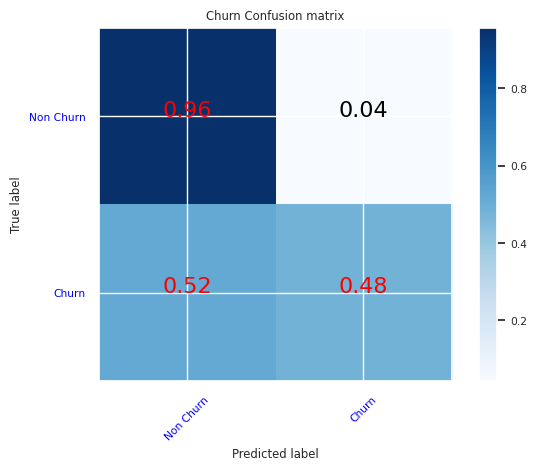

In [ ]:
# Menghitung confusion matrix untuk evaluasi performa model
cfm = confusion_matrix(y_test, y_pred=y_pred)

# Menampilkan confusion matrix dalam bentuk grafik dengan normalisasi
plot_confusion_matrix(
    cfm,
    normalize=True,
    classes=['Non Churn','Churn'],
    title='Churn Confusion matrix'
)

# Mendapatkan nilai True Negatives, False Positives, False Negatives, dan True Positives
tn, fp, fn, tp = cfm.ravel()

# Menampilkan jumlah True Negatives, False Positives, False Negatives, dan True Positives
print("True Negatives: ", tn)
print("False Positives: ", fp)
print("False Negatives: ", fn)
print("True Positives: ", tp)

##### Insights 💡

1. Model memiliki kinerja baik dalam mengidentifikasi pelanggan yang tidak churn (TN yang tinggi).

2. Namun, model memiliki kesulitan dalam mengidentifikasi pelanggan yang sebenarnya churn (FN yang tinggi).

3. Terdapat jumlah False Positives yang relatif rendah (FP), yang menunjukkan bahwa model tidak terlalu sering membuat kesalahan dengan memprediksi pelanggan yang tidak sebenarnya churn sebagai churn.

# 11.&nbsp;ROC Curve

In [ ]:
!pip install scikit-plot

[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] Unknown parameter: base_score
[LightGBM] [Warning] Unknown parameter: gamma
[LightGBM] [Warning] Unknown parameter: silent
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


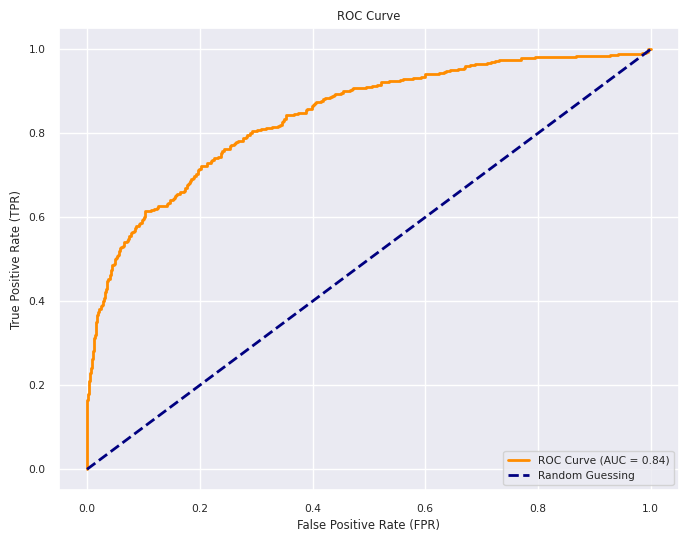

In [ ]:
import scikitplot as skplt
# Q2 (15 Points)
# Prediksi probabilitas pada data uji (X_test)
y_prob = lgbm_model.predict_proba(X_test)[:, 1]

# Menghitung false positive rate (FPR) dan true positive rate (TPR) untuk ROC Curve
fpr, tpr, thresholds = roc_curve(y_test, y_prob)

# Menghitung Area Under the Curve (AUC) menggunakan roc_auc_score
roc_auc = roc_auc_score(y_test, y_prob)

# Menampilkan ROC Curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC Curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--', label='Random Guessing')
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('ROC Curve')
plt.legend(loc='lower right')
plt.show()

##### Insights 💡

1. Pada Kurva ROC tersebut, AUC (Area Under Curve) adalah 0,84. Nilai AUC yang tinggi menunjukkan bahwa model memiliki kinerja yang baik. Semakin tinggi AUC, semakin baik model tersebut dalam membedakan antara kelas positif dan negatif.

2. Berdasarkan Kurva ROC tersebut, dapat disimpulkan bahwa model memiliki kinerja yang baik dalam memprediksi kelas positif. Model dapat dengan akurat memprediksi kasus-kasus positif, dengan tingkat kesalahan positif yang rendah.

# 12.&nbsp;Feature Importance

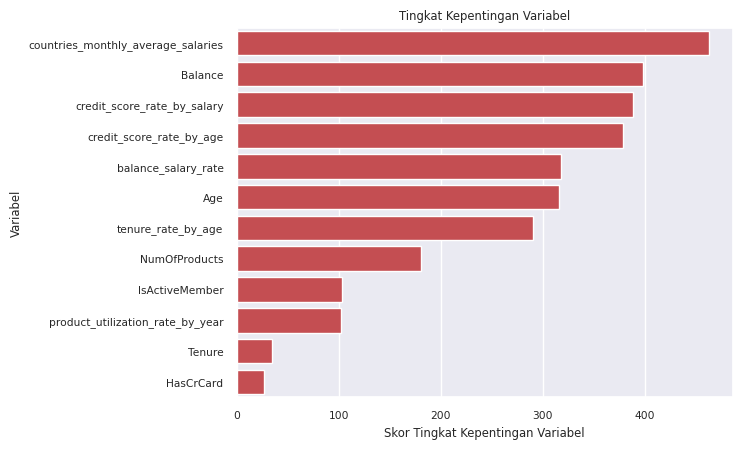

In [ ]:
# Menghitung tingkat kepentingan variabel menggunakan feature_importances_ dari model LightGBM
feature_index = df_encoded.loc[:, df_encoded.columns != dependent_variable_name]
feature_importance = pd.Series(lgbm_model.feature_importances_, index=feature_index.columns)

# Mengurutkan variabel berdasarkan tingkat kepentingannya secara menurun
feature_importance = feature_importance.sort_values(ascending=False)

# Menampilkan tingkat kepentingan variabel dalam bentuk diagram batang
sns.barplot(
    x=feature_importance,
    y=feature_importance.index,
    color='r',
    saturation=1
)

# Menambahkan label dan judul pada diagram batang
plt.xlabel('Skor Tingkat Kepentingan Variabel')
plt.ylabel('Variabel')
plt.title('Tingkat Kepentingan Variabel')
plt.show()

# 13.&nbsp;Conclusion



In [ ]:
#Q3 (50 Points)

##### Rangkuman 📊

1. **Preprocessing Data:**
    - Data berhasil dipersiapkan dengan menangani nilai-nilai yang hilang dan mengenkoding variabel kategorikal.
    - Pembagian data latih dan uji dilakukan untuk melatih dan menguji model.
    
2. **Pemilihan Model dan Pelatihan:**
    - Beberapa model klasifikasi, termasuk Logistic Regression, K-Nearest Neighbors, Decision Tree, RandomForest, Gradient Boosting, XGBoost, dan LightGBM, dievaluasi.
    - LightGBM dipilih sebagai model terbaik berdasarkan evaluasi performa pada data uji.

3. **Evaluasi Model:**
    - Model LightGBM memiliki akurasi yang baik, namun mengalami kesulitan dalam mengidentifikasi pelanggan yang sebenarnya churn (tingginya False Negative Rate).
    - Penggunaan ROC Curve memberikan wawasan tambahan tentang performa model dalam memprediksi kelas positif.

4. **Analisis Variabel Kepentingan:**
    - Variabel-variabel yang paling mempengaruhi prediksi churn diidentifikasi menggunakan feature importance dari model LightGBM.
    - Diagram batang menunjukkan urutan variabel berdasarkan tingkat kepentingannya.
    
5. **Pertimbangan Kinerja Model:**
    - Model perlu penyesuaian lebih lanjut untuk meningkatkan kemampuannya dalam mengidentifikasi pelanggan yang sebenarnya churn (reduksi False Negatives).
    - Evaluasi berkala dan pemantauan performa model dianjurkan seiring perubahan data.

# 14. Suggestion


In [ ]:
#Q4 (20 Points)

##### Rekomendasi 📊

1. Terus meningkatkan model untuk mengurangi kesalahan prediksi, khususnya pada kasus False Negatives.

2. Menyelidiki lebih lanjut variabel-variabel kunci yang mempengaruhi prediksi churn.

3. Melakukan penambahan fitur atau eksplorasi lebih lanjut untuk meningkatkan keakuratan model.

4. Melakukan pemantauan dan evaluasi berkala terhadap performa model saat data bertambah atau berubah seiring waktu.